In [2]:
from __init__ import DATASET_PATH


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, r2_score, PredictionErrorDisplay
from tqdm import tqdm

from sklearn.preprocessing import RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RepeatedKFold

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import ConfusionMatrixDisplay

from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif, SelectPercentile
# https://jundongl.github.io/scikit-feature/algorithms.html
from skfeature.function.statistical_based import gini_index


from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest, r_regression, f_regression, mutual_info_regression, RFECV
from sklearn.metrics import make_scorer
from imblearn.metrics import geometric_mean_score
gmean_scorer = make_scorer(geometric_mean_score)

import dtreeviz

from textwrap import wrap
from functools import reduce

from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

from sklearn.metrics import classification_report
from sklearn.discriminant_analysis import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from main.components.scaler import Scaler
from main.components.imputer import Imputer
from main.components.one_hot_encoder import CustomOneHotEncoder
from main.constants import CATEGORICAL_ATTRIBUTES, CONTINUOUS_ATTRIBUTES, IGF, PROLACTIN, VITAMINE_D, PCO
from main.components.preprocessing_methods import get_continuous_attributes_except, get_categorical_attributes_except, explore_all_variations_of_preprocessing

from main.components.hyperparameter_tuning_methods import hyperparameter_tuning_general, hyperparameter_tuning_linear, compare_random_states, train_model, validate_model_classification
from main.components.feature_importance_methods import feature_selection_gini_index, feature_selection_chi2, plot_fancy_tree, plot_fancy_tree_smote, get_feature_importance_logistic_regressison, get_feature_importance_knn, get_feature_importance_tree, get_feature_importance_rf, rename_importnace_col, merge_feature_importances, rank_importances, feature_selection_mutual_info_classification, recursive_feature_elimination, get_permutation_importance

import random

from main.components.hyperparameter_tuning_methods import validate_model_classification_smote



from imblearn.pipeline import Pipeline as ImblearnPipeline
from imblearn.over_sampling import SMOTENC

import nest_asyncio
nest_asyncio.apply()

pd.set_option('display.max_columns', None) # enable showing all columns of the df
pd.set_option('display.max_rows', None)
pd.set_option("display.expand_frame_repr", True)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)


In [3]:
dataset_file_path = DATASET_PATH
df = pd.read_csv(dataset_file_path)
df.sample(5)

,"PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro",IGF-1 ng/ml (N: 100-311),proBNP,"AMH (ng/ml) *7,14=pmol/l",weight,height (cm),BMI,systolic BP (ciśnienie skurczowe),diastolic BP (ciśnienie rozskurczowe),Hypertension,Waist Circumference (WC),WC>88,Hip Circumference (HC),WHR (Waist/Hip ratio),"WHR>0,85 (WHO)","WHR>0,8 (NIDDK)",WHTR (Waist/Height Ratio),"WHTR>0,5","overweight/obesity 0-normal/low, 1-overweight, 2-obesity","irregular cycles (0-nie, 1-tak)","ovulation (0-brak, 1-obecna)","PCO ovary morfology in USG (0-brak, 1--obecna)","stromal hypertrophy in ovary (0-brak, 1-obecny)",acne,hirsutism,FG score (Ferriman-Gallway score - stopień androgenizacji),hyperandrogenism,elevated DHT,hypothyroidism,Volume of the thyroid Right Lobe,Volume of the thyroid Left Lobe,thyroid volume,"nodules 0-lack, 1-RL, 2-LL, 3-both",chronic thyroiditis,Vole of the Right Ovary,Volume of the Left Ovary,ovaries volume - total,follicules >12,WBC x10^3/ul,neutrophil x10^3/ul,lymphocytes x10^3/ul,monocytes x10^3/ul,eosinocytes x10^3/ul,basophils x10^3/ul,% neutrophil,% lymphocytes,% monocytes,%eosinocytes,%basophils,RBC x10^6ul,Hemoglobin [g/dl],hematocrit [%],HTC/Hb,MCV fl,MCH pg,MCHC g/dl,RDW-CV %,PLT x10^3/ul,PDW fl,MPV fl,P-LCR %,PLT/WBC,MPV/PLT,PLR,limf/mono,NLR (stosunek neutrofili do limfocytów),L/WCC (leukocyty do całkowitej liczby krwinek białych),eos/leukocyty,sodium mmol/l,potassium mmol/l,calcium mg/dl,phosphorus mg/dl,creatinine mg/dl,CRP mg/l,ALT U/l,AST U/l,Bilirubin mg/dl,CHOL mmol/l,CHOL>200,HDL mmol/l,HDL<50,LDL mmol/l,LDL>135,TG mmol/l,Atherogenic index (AI) (LDL-C/HDL-C),coronary risk index (CRI) (TG/HDL-C),VAI - Visceral adiposity index,BAI - Body adiposity index,LAP INDEX - Lipid accumulation product index,TyG Index - Trigliceride-glucose index,AIP -Atherogenic index of plasma,UIBC ug/dl,ferrum ug/dl,TIBC,TSAT,ferritin ng/ml,glucose 0 mg/dl,glucose 120 mg/dl,insulin 0 uU/ml,Insulin 120 uU/ml,HOMA,Matsuda,"QUICKI (N<0,357)",TSH mIU/L,FT3 pmol/l,FT4 pmol/l,Anty-TPO IU/ml,Anty-TG IU/ml,FSH mlU/ml,LH,LH/FSH,prolactin,DHEA-S ug/dl,testosterone nmol/l,T (ng/ml),T/SHBG,E(pg/ml)/T(ng/ml)/,Parathormone pg/ml,cortisol nmol/l 8:00,cortisol nmol/l 18:00,Estradiol pg/ml,SHBG nmol/l,SHBG>110,FTI (free testosterone index),ACTH pg/ml,HbA1c %,vitamin 25-OH D ng/ml,Androstendione ng/ml,17-OH-progesterone ng/ml,Dihydrotestosterone pg/ml (N<368),Testosterone/DHT,T/A (testosterone/androstendione),age
151,0,NaN,43.28,NaN,58.0,170.0,20.069204,NaN,NaN,NaN,72.0,0.0,82.0,0.878049,1.0,1.0,0.423529,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,2.639,2.3520,4.991,0.0,0.0,NaN,NaN,NaN,NaN,9.13,5.28,2.93,0.56,0.29,0.07,57.8,32.1,6.1,3.2,0.8,4.26,12.4,36.6,2.951613,85.9,29.1,33.9,12.6,279.0,11.0,9.8,23.9,30.558598,0.035125,95.221843,5.232143,1.802048,0.320920,0.031763,NaN,NaN,NaN,NaN,0.80,2.6,NaN,NaN,NaN,4.47378,0.0,2.27568,0.0,1.582632,0.0,1.35480,0.695455,1.363636,1.079533,30.235294,18.96720,4.597105,0.134699,NaN,NaN,NaN,NaN,NaN,82.0,84.0,7.58,NaN,1.534716,NaN,0.357976,2.87,4.32,12.90,9.0,10.0,3.2,1.9,0.593750,NaN,137.0,1.40,0.403458,0.007000,NaN,NaN,NaN,NaN,NaN,200.0,1.0,NaN,NaN,NaN,NaN,3.15,2.36,NaN,NaN,0.444444,22.0
811,2,3.53,34.48,3.0,51.0,159.0,20.173253,103.0,73.0,0.0,68.0,0.0,76.0,0.894737,1.0,1.0,0.427673,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.0,7.770,5.9670,13.737,1.0,1.0,5.05,5.95,11.00,0.0,6.12,2.79,2.45,0.37,0.43,0.08,45.7,40.0,6.0,7.0,1.3,3.83,11.5,34.7,3.017391,90.6,30.0,33.1,13.4,243.0,12.5,10.7,30.5,39.705882,0.044033,99.183673,6.621622,1.138776,0.400327,0.070261,145.0,4.23,9.90,3.59,0.83,0.4,13.0,24.0,0.50,4.65480,0.0,1.83606,0.0,2.128278,0.0,1.45641,1.159155,1.816901,1.354879,29.798742,14.56410,4.608261,0.259331,258.0,118.0,375.0,31.0,25.0,78.0,84.0,4.03,43.08,0.776148,12.91,0.400416,2.99,4.43,11.21,8.0,10.0,4.2,5.7,1.357143,226.0,306.0,1.30,0.374640,0.029885,50.715384,39.27,413.0,NaN,19.0,43.5,0.0,2.87,16.68,5.2,20.0,3.53,2.47,349.0,NaN,0.368272,23.0
541,1,487.00,20.38,NaN,60.5,169.0,21.182732,101.0,61.0,0.0,67.0,0.0,79.0,0

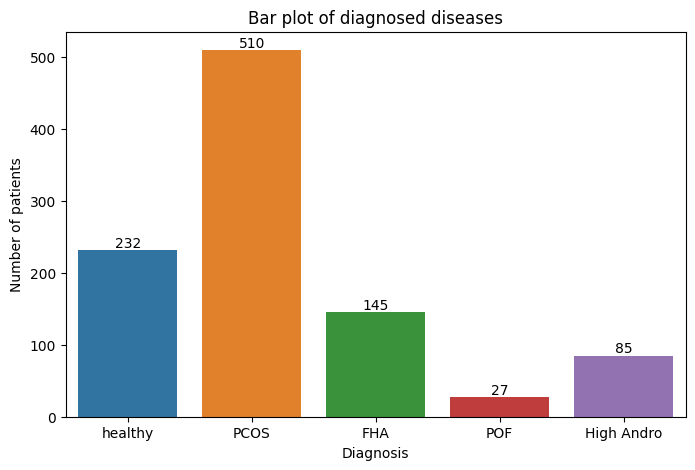

In [4]:
labels = {0: 'healthy', 1: 'PCOS', 2: 'FHA', 3: 'POF', 4: 'High Andro'}
df['PCO_label'] = df[PCO].map(labels)

plt.figure(figsize=(8, 5))
ax = sns.countplot(data=df, x='PCO_label', order=['healthy', 'PCOS', 'FHA', 'POF', 'High Andro'], hue='PCO_label')

for i, p in enumerate(ax.patches):
    ax.bar_label(ax.containers[i])

plt.xlabel('Diagnosis')
plt.ylabel('Number of patients')
plt.title('Bar plot of diagnosed diseases')
plt.show()

# Model selection for PCO

### Remove the `POF` class

In [5]:
df.loc[df[PCO] == 3, PCO] = np.nan

#  change all 4s to 3s for the need of the visualisation algorithm
df[PCO] = np.where(df[PCO] == 4, 3, df[PCO])


CLASS_NAMES = ['healthy', 'PCOS', 'FHA', 'High Andro']

In [6]:
df_cleaned = df.dropna(subset=[PCO])

X, y = df_cleaned.drop(columns=[PCO]), df_cleaned[PCO]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Best preprocessing

In [7]:
continuous_preprocessor_tree_hyperparam_tuning = Pipeline([('imputer', KNNImputer(n_neighbors=10))])
continuous_preprocessor_tree = Pipeline([('imputer',  IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])


continuous_preprocessor_hyperparam_tuning = Pipeline([('scaler', MinMaxScaler()), ('imputer', KNNImputer(n_neighbors=10))])
continuous_preprocessor =  Pipeline([('scaler', MinMaxScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])


categorical_preprocessor = Pipeline([('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=40, initial_strategy='most_frequent')), ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary'))])


preprocessor = ColumnTransformer(
    verbose_feature_names_out=False,
    transformers=[
        ('num', continuous_preprocessor, CONTINUOUS_ATTRIBUTES),
        ('cat', categorical_preprocessor, get_categorical_attributes_except(PCO))
    ])

For smote


In [8]:
# continuous_imputer_pipeline = Pipeline([('scaler', MinMaxScaler()), ('imputer', KNNImputer(n_neighbors=10))])
continuous_imputer_pipeline = Pipeline([('scaler', MinMaxScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])

 # continuous_imputer_tree_pipeline = Pipeline([('imputer', KNNImputer(n_neighbors=10))])

continuous_imputer_tree_pipeline = Pipeline([('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])

categorical_imputer_pipeline = Pipeline([
    ('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=40, initial_strategy='most_frequent')),
    ])

### Selection of best preprocessing

In [29]:
def explore_all_variations_of_preprocessing_claffisication(X_train, y_train, target_attribute, models, continuous_preprocessings, categorical_preprocessings, scoring_metric='gmean'):
    scores_df = pd.DataFrame(columns=['continuous_preprocessing', 'categorical_pteprocessing', 'model', str(scoring_metric)])

    i = 1
    total_iterations = len(continuous_preprocessings) * len(categorical_preprocessings) * len(models)

    for continuous_preprocessor_name, continuous_preprocessor in continuous_preprocessings.items():
        for categorical_preprocessor_name, categorical_preprocessor in categorical_preprocessings.items():
            for model in models:
                preprocessor = ColumnTransformer(
                    verbose_feature_names_out=False,
                    transformers=[
                        ('num', continuous_preprocessor, get_continuous_attributes_except(target_attribute)),
                        ('cat', categorical_preprocessor, get_categorical_attributes_except(target_attribute))
                    ])

                pipeline = Pipeline([('preprocessor', preprocessor), ('model', model)])
                pipeline = get_smote_pipeline(model, target_attribute, get_continuous_attributes_except(target_attribute),  get_categorical_attributes_except(target_attribute), continuous_preprocessor, categorical_preprocessor)

                cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=42)
                scores = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring=scoring_metric, n_jobs=-1)
                
                scores_df.loc[len(scores_df)] = [continuous_preprocessor_name, categorical_preprocessor_name, str(model), abs(scores.mean())]
                print(f'{i}/{total_iterations}', str(model), continuous_preprocessor_name, categorical_preprocessor_name, scores, abs(scores.mean()))
                i += 1

    return scores_df


def get_smote_pipeline(model, target_attribute, continuous_attributes, categorical_attributes, continous_imputer_pipeline, categorical_imputer_pipeline):
    imputer_transformer = ColumnTransformer(
        verbose_feature_names_out=False,
        transformers=[
            ('num', continous_imputer_pipeline, continuous_attributes),
            ('cat', categorical_imputer_pipeline, categorical_attributes)
        ])
    imputer_transformer.set_output(transform='pandas')

    smt = SMOTENC(random_state=42, categorical_features=categorical_attributes)

    categorical_one_hot_encoder = Pipeline([
        ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary', sparse_output=False)),
        ])

    one_hot_encoding_transformer = ColumnTransformer(
            verbose_feature_names_out=False,
            remainder='passthrough',
            transformers=[
                ('cat', categorical_one_hot_encoder, categorical_attributes),
            ]).set_output(transform='pandas')
    

    model_pipeline = ImblearnPipeline([
                ('imputing', imputer_transformer),
                ('smt', smt),
                ('preprocessor', one_hot_encoding_transformer),
                ('model', model),
                ])

    return model_pipeline




In [36]:

from sklearn.discriminant_analysis import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler


models = [
        LogisticRegression(),
        KNeighborsClassifier(),
        ]


continuous_preprocessings = {
    # 'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', KNNImputer(n_neighbors=10))]),
    
    'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
}

categorical_preprocessings = {
    'ii_imputer': Pipeline([('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='most_frequent'))]),
}



scores_df = explore_all_variations_of_preprocessing_claffisication(X_train, y_train, PCO, models, continuous_preprocessings, categorical_preprocessings, scoring_metric=gmean_scorer)
scores_df.sort_values(by="make_scorer(geometric_mean_score, response_method='predict')", ascending=False)

1/6 LogisticRegression() Min Max ii_imputer [0.56743215 0.60580423 0.59847401 0.70009043 0.54763251 0.5930293
 0.68289755 0.60200435 0.58536865 0.50909711 0.55971012 0.61092883
 0.54198984 0.6677323  0.7727707 ] 0.60966413846666
2/6 KNeighborsClassifier() Min Max ii_imputer [0.58056851 0.60387093 0.53960285 0.60288177 0.51512789 0.50384899
 0.5898669  0.55395764 0.5160043  0.4379019  0.46487574 0.50964447
 0.41182322 0.51089397 0.59274505] 0.528907609880144
3/6 LogisticRegression() Standard Scaler ii_imputer [0.56462701 0.51805653 0.57205613 0.63788452 0.         0.51001504
 0.63631484 0.5276035  0.56468833 0.53724646 0.50547768 0.56026663
 0.49664757 0.63384435 0.65578421] 0.528034187531422
4/6 KNeighborsClassifier() Standard Scaler ii_imputer [0.3492671  0.4427046  0.36157272 0.45715333 0.43527714 0.43927916
 0.4005616  0.40732889 0.3853374  0.3675556  0.3863562  0.45565126
 0.34392046 0.45276946 0.45079187] 0.40903511914685947
5/6 LogisticRegression() Power Transformer ii_imputer [0

,continuous_preprocessing,categorical_pteprocessing,model,"make_scorer(geometric_mean_score, response_method='predict')"
0,Min Max,ii_imputer,LogisticRegression(),0.609664
4,Power Transformer,ii_imputer,LogisticRegression(),0.539757
1,Min Max,ii_imputer,KNeighborsClassifier(),0.528908
2,Standard Scaler,ii_imputer,LogisticRegression(),0.528034
3,Standard Scaler,ii_imputer,KNeighborsClassifier(),0.409035
5,Power Transformer,ii_imputer,KNeighborsClassifier(),0.346843


## Hyperparameter tuning

### Decision Tree

In [ ]:
model_tree = DecisionTreeClassifier()
param_grid_tree = {
    'model__criterion': ['gini'],
    'model__max_depth': [3, 4, 5],
    'model__min_samples_split': [4, 5, 6],
    'model__min_samples_leaf': [3, 4, 5],
    'model__class_weight': [None],
}

tree_h_scores = hyperparameter_tuning_general(X_train, y_train, PCO, model_tree, continuous_preprocessor_tree_hyperparam_tuning, categorical_preprocessor, param_grid_tree, scoring_metric=gmean_scorer)
tree_h_scores.sort_values(by='mean_test_score', ascending=False)

In [11]:
model = DecisionTreeClassifier(criterion="gini", max_depth=5, min_samples_leaf=2, min_samples_split=5, splitter='random')

tuned_df = compare_random_states(X_train, y_train, model, PCO, continuous_preprocessor_tree_hyperparam_tuning, categorical_preprocessor)
tuned_df.abs.sort_values(by='cv_score', ascending=False).head(5)

100%|██████████| 99/99 [15:19<00:00,  9.28s/it]


,cv_score
18,-0.493617
64,-0.504952
75,-0.507124
45,-0.509694
55,-0.509711


### Logistic Regression

Fitting 15 folds for each of 8 candidates, totalling 120 fits


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Best parameters: {'model__C': 5}
Best score (make_scorer(geometric_mean_score, response_method='predict')): 0.5689462144067708


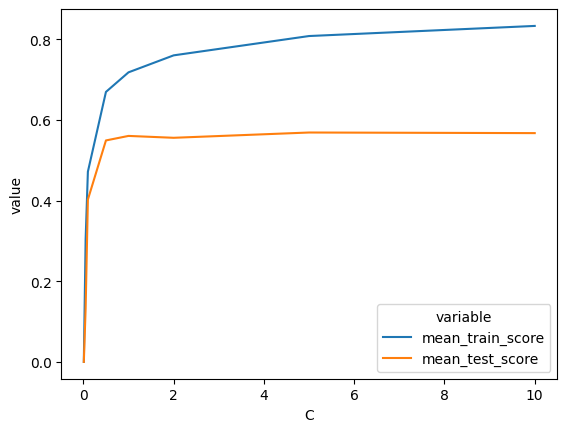

,C,mean_train_score,mean_test_score
0,0.01,0.000000,0.000000
1,0.05,0.303869,0.132890
2,0.1,0.471842,0.402721
3,0.5,0.669609,0.549271
4,1,0.718188,0.560500
5,2,0.760292,0.555848
6,5,0.808212,0.568946
7,10,0.833291,0.567444


In [16]:
model_lr = LogisticRegression(multi_class='multinomial', max_iter=100000, n_jobs=-1)

param_grid_lr = {
    'model__C': [0.01, 0.05, 0.1, 0.5, 1, 2, 5, 10],
}

lr_h_scores = hyperparameter_tuning_linear(X_train, y_train, PCO, model_lr, continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, param_grid_lr, main_parameter='C', scoring_metric=gmean_scorer)
lr_h_scores

Selected C=0.5

Fitting 15 folds for each of 7 candidates, totalling 105 fits


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Best parameters: {'model__n_neighbors': 5}
Best score (make_scorer(geometric_mean_score, response_method='predict')): 0.3592289726195241


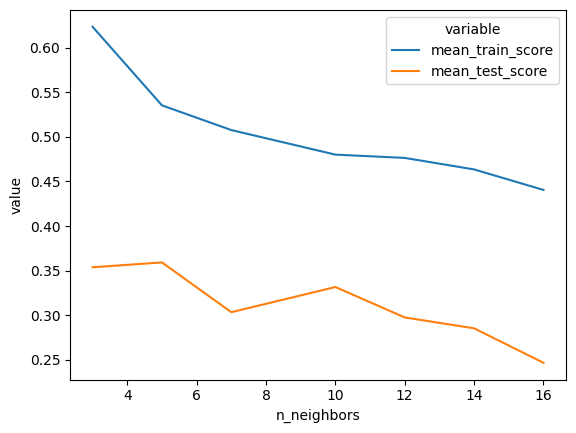

,n_neighbors,mean_train_score,mean_test_score
0,3,0.623248,0.353797
1,5,0.535219,0.359229
2,7,0.507540,0.303462
3,10,0.480019,0.331670
4,12,0.476332,0.297573
5,14,0.463424,0.285410
6,16,0.440463,0.246791


In [21]:
model_lr = KNeighborsClassifier()

#  selected: k=5
param_grid_lr = {
    'model__n_neighbors': [3, 5, 7, 10, 12, 14, 16],
}

lr_h_scores = hyperparameter_tuning_linear(X_train, y_train, PCO, model_lr, continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, param_grid_lr, main_parameter='n_neighbors', scoring_metric=gmean_scorer)
lr_h_scores

### Random Forest

In [72]:
model_rf = RandomForestClassifier(n_jobs=-1)

param_grid_rf = {
    'model__criterion': ['gini'],
    'model__class_weight': ['balanced_subsample'],
    'model__n_estimators': [200],
    'model__max_features': ['sqrt'],
    'model__max_depth': [None],
    'model__min_samples_split': [3, 4, 5],
    'model__min_samples_leaf': [5, 6, 7],
}

rf_h_scores = hyperparameter_tuning_general(X_train, y_train, PCO, model_rf, continuous_preprocessor_tree_hyperparam_tuning, categorical_preprocessor, param_grid_rf, scoring_metric='f1_weighted')
rf_h_scores.sort_values(by='mean_test_score', ascending=False)

Fitting 15 folds for each of 9 candidates, totalling 135 fits
Best parameters: {'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 5, 'model__n_estimators': 200}
Best score (f1_weighted): 0.7826160815395791


,params,mean_train_score,mean_test_score
8,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 5, 'model__n_estimators': 200}",0.913822,0.782616
4,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 6, 'model__min_samples_split': 4, 'model__n_estimators': 200}",0.928839,0.780565
2,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 5, 'model__n_estimators': 200}",0.948672,0.780479
3,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 6, 'model__min_samples_split': 3, 'model__n_estimators': 200}",0.930861,0.778460
1,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 4, 'model__n_estimators': 200}",0.948119,0.778261
5,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 6, 'model__min_samples_split': 5, 'model__n_estimators': 200}",0.929055,0.778234
6,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 3, 'model__n_estimators': 200}",0.915132,0.777261
0,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 3, 'model__n_estimators': 200}",0.947720,0.775780
7,"{'model__class_weight': 'balanced_subsample', 'model__criterion': 'gini', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 4, 'model__n_estimators': 200}",0.912644,0.774311


In [12]:
model = RandomForestClassifier(n_estimators=200, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=5, class_weight='balanced_subsample')

tuned_df = compare_random_states(X_train, y_train, model, PCO, continuous_preprocessor_tree_hyperparam_tuning, categorical_preprocessor)
tuned_df.abs().sort_values(by='cv_score', ascending=False).head(5)

100%|██████████| 99/99 [19:35<00:00, 11.88s/it]


,cv_score
25,-0.39638
56,-0.398133
70,-0.399275
94,-0.402765
98,-0.405842


### SVM

In [ ]:
model_svc = SVC(n_jobs=-1, decision_function_shape='ovo')

param_grid_svc = {
    'model__kernel': ['linear', 'rbf', 'sigmoid'],
    'model__C': [0.1, 1, 10, 100],
    'model__gamma': [0.1, 1, 10],
    'model__epsilon': [0.1, 0.2, 0.3],
}

svc_h_scores = hyperparameter_tuning_general(X_train, y_train, PCO, model_svc, continuous_preprocessor, categorical_preprocessor, param_grid_svc, scoring_metric='f1_weighted')
svc_h_scores.sort_values(by='mean_test_score', ascending=False)

## Best models

### DecisionTree

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


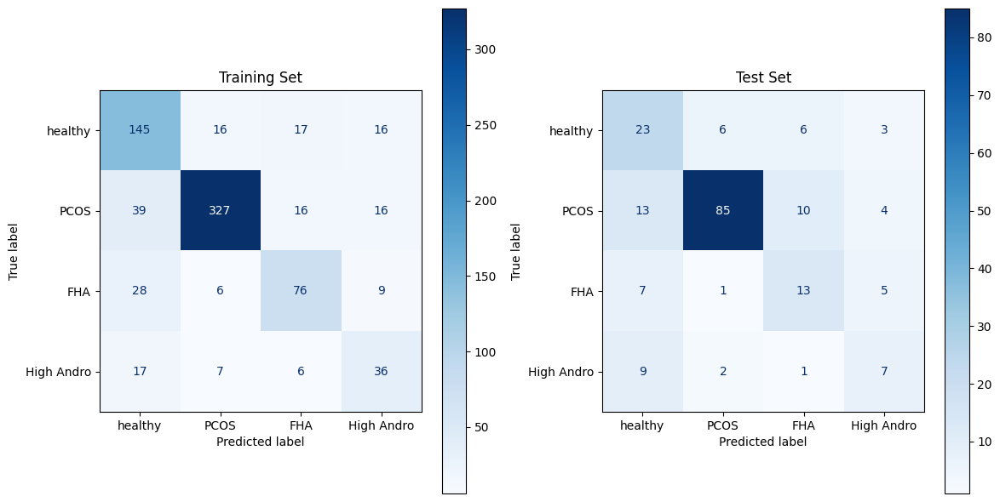

Training set
G-mean: 0.68
              precision    recall  f1-score   support

     healthy       0.63      0.75      0.69       194
        PCOS       0.92      0.82      0.87       398
         FHA       0.66      0.64      0.65       119
  High Andro       0.47      0.55      0.50        66

    accuracy                           0.75       777
   macro avg       0.67      0.69      0.68       777
weighted avg       0.77      0.75      0.76       777

G-mean: 0.539
Test set
              precision    recall  f1-score   support

     healthy       0.44      0.61      0.51        38
        PCOS       0.90      0.76      0.83       112
         FHA       0.43      0.50      0.46        26
  High Andro       0.37      0.37      0.37        19

    accuracy                           0.66       195
   macro avg       0.54      0.56      0.54       195
weighted avg       0.70      0.66      0.67       195



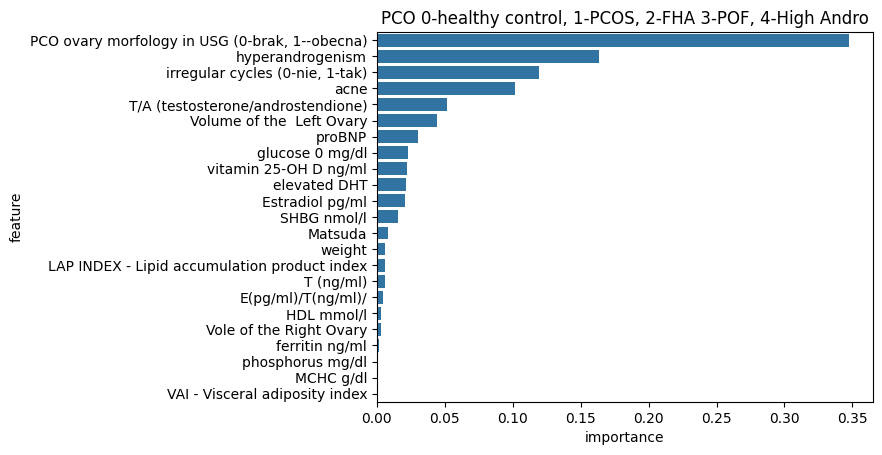

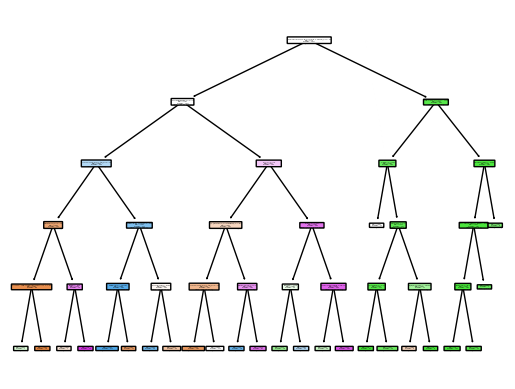

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


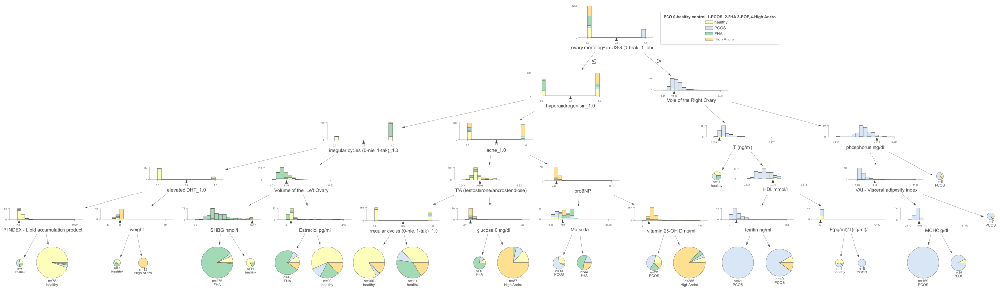

In [42]:
random.seed(0)

model_tree = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight=None)

feature_importnces_tree, pipeline_tree = validate_model_classification_smote(model_tree, PCO, CLASS_NAMES, X_train, y_train, X_test, y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_tree)

plot_fancy_tree_smote(pipeline_tree, X_train, y_train, PCO, show_artificial_data=True, class_names=CLASS_NAMES)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


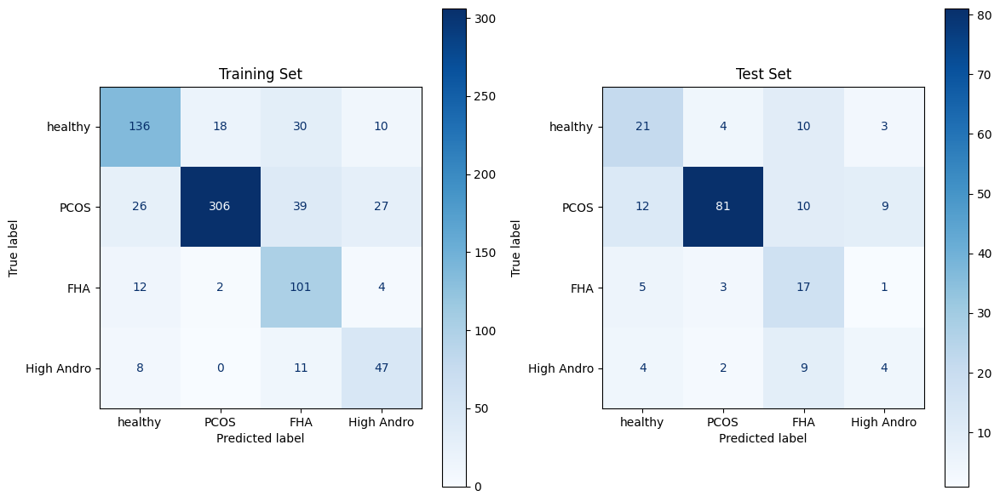

Training set
G-mean: 0.755
              precision    recall  f1-score   support

     healthy       0.75      0.70      0.72       194
        PCOS       0.94      0.77      0.85       398
         FHA       0.56      0.85      0.67       119
  High Andro       0.53      0.71      0.61        66

    accuracy                           0.76       777
   macro avg       0.69      0.76      0.71       777
weighted avg       0.80      0.76      0.77       777

G-mean: 0.484
Test set
              precision    recall  f1-score   support

     healthy       0.50      0.55      0.53        38
        PCOS       0.90      0.72      0.80       112
         FHA       0.37      0.65      0.47        26
  High Andro       0.24      0.21      0.22        19

    accuracy                           0.63       195
   macro avg       0.50      0.54      0.51       195
weighted avg       0.69      0.63      0.65       195



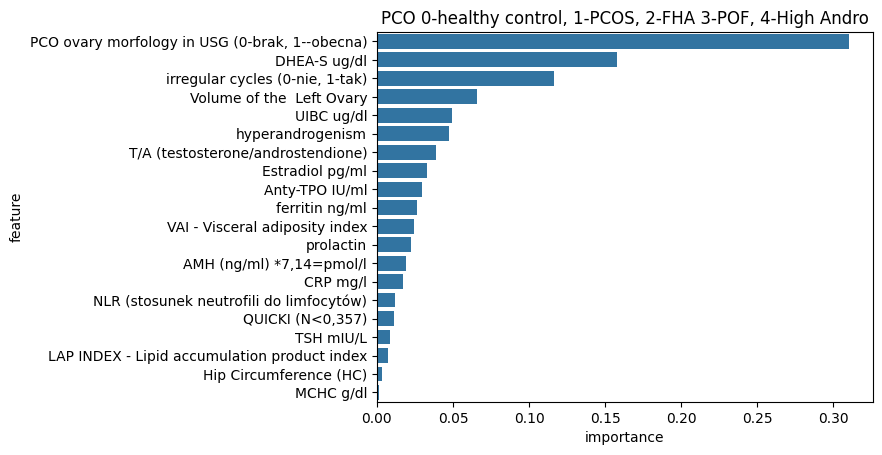

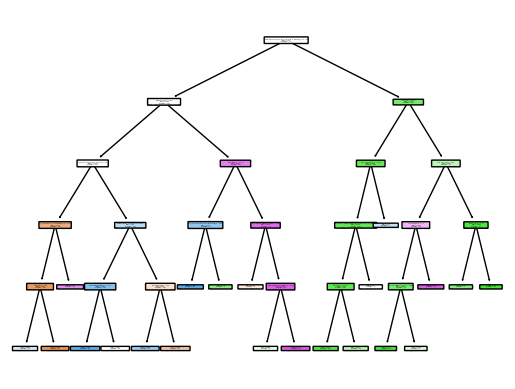

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


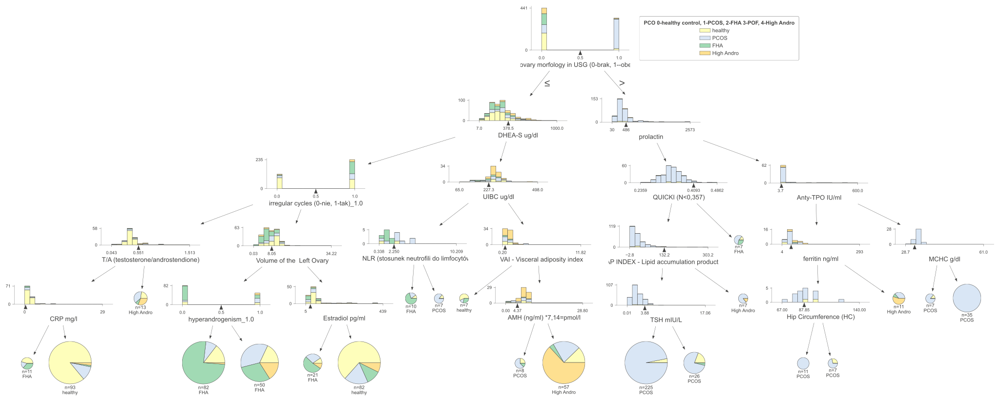

In [14]:
model_tree = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight='balanced', splitter='best')

feature_importnces_tree, pipeline_tree = validate_model_classification(model_tree, PCO, CLASS_NAMES, X_train, y_train, X_test, y_test, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_tree)

plot_fancy_tree(pipeline_tree, X_train, y_train, PCO, CLASS_NAMES)

### RandomForest

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


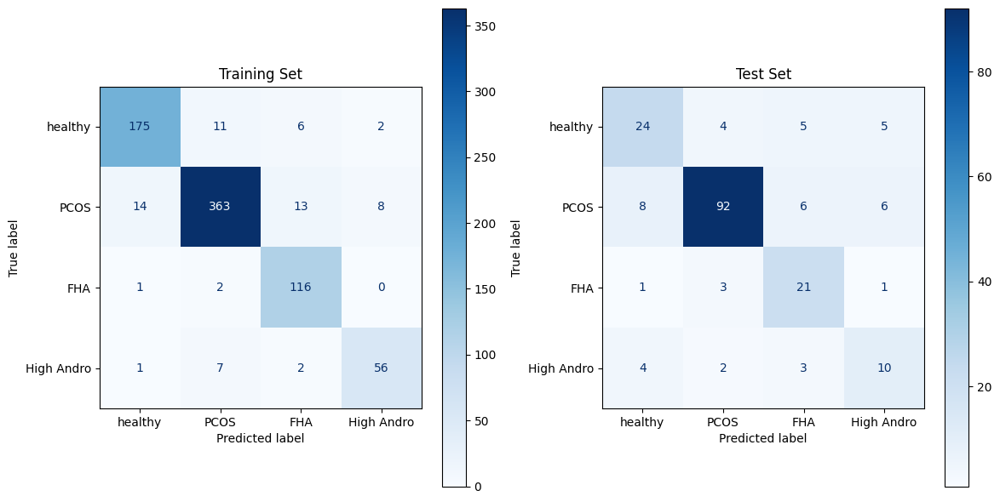

Training set
G-mean: 0.908
              precision    recall  f1-score   support

     healthy       0.92      0.90      0.91       194
        PCOS       0.95      0.91      0.93       398
         FHA       0.85      0.97      0.91       119
  High Andro       0.85      0.85      0.85        66

    accuracy                           0.91       777
   macro avg       0.89      0.91      0.90       777
weighted avg       0.92      0.91      0.91       777

G-mean: 0.685
Test set
              precision    recall  f1-score   support

     healthy       0.65      0.63      0.64        38
        PCOS       0.91      0.82      0.86       112
         FHA       0.60      0.81      0.69        26
  High Andro       0.45      0.53      0.49        19

    accuracy                           0.75       195
   macro avg       0.65      0.70      0.67       195
weighted avg       0.77      0.75      0.76       195



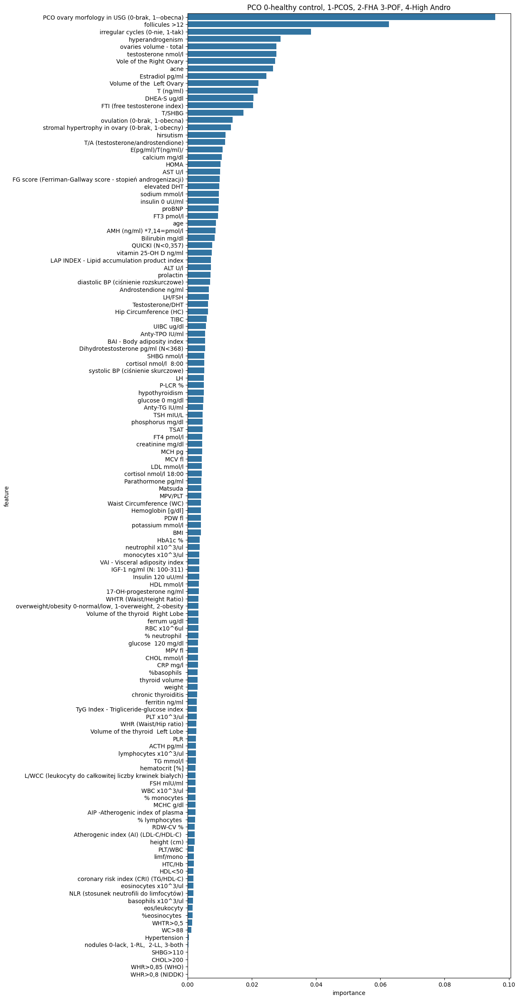

In [43]:
model_rf = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight=None, random_state=72)


feature_importnces_rf, pipeline_rf = validate_model_classification_smote(model_rf, PCO, CLASS_NAMES, X_train, y_train, X_test, y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_rf)


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


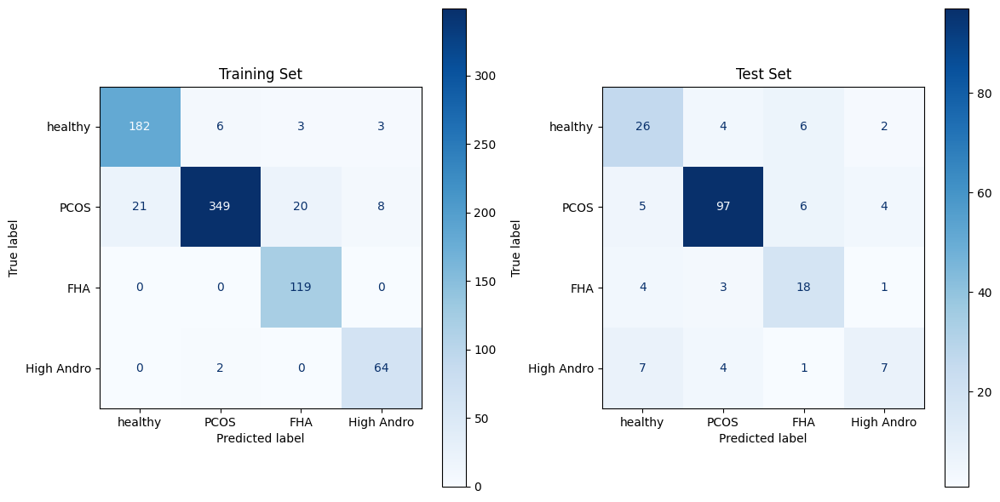

Training set
G-mean: 0.945
              precision    recall  f1-score   support

     healthy       0.90      0.94      0.92       194
        PCOS       0.98      0.88      0.92       398
         FHA       0.84      1.00      0.91       119
  High Andro       0.85      0.97      0.91        66

    accuracy                           0.92       777
   macro avg       0.89      0.95      0.92       777
weighted avg       0.93      0.92      0.92       777

G-mean: 0.624
Test set
              precision    recall  f1-score   support

     healthy       0.62      0.68      0.65        38
        PCOS       0.90      0.87      0.88       112
         FHA       0.58      0.69      0.63        26
  High Andro       0.50      0.37      0.42        19

    accuracy                           0.76       195
   macro avg       0.65      0.65      0.65       195
weighted avg       0.76      0.76      0.76       195



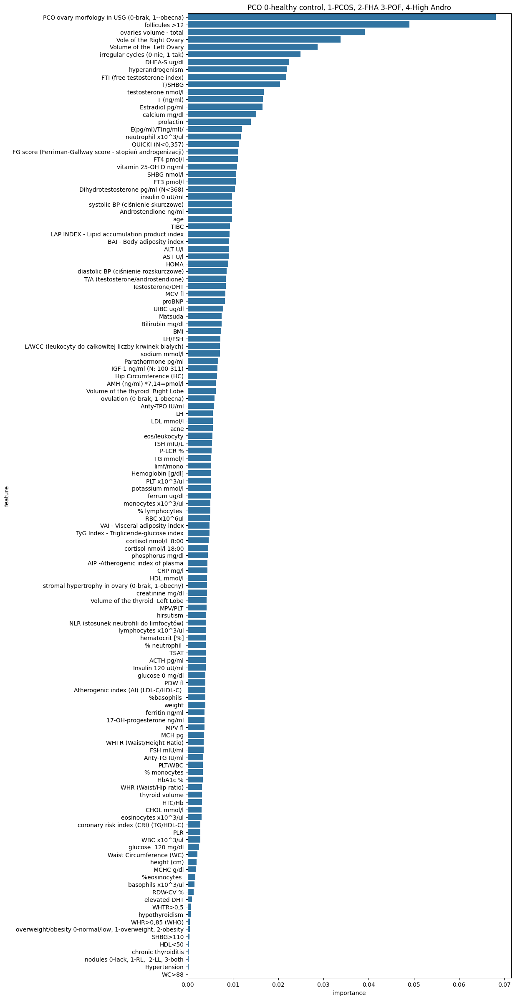

In [9]:
model_rf = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight='balanced_subsample', random_state=72)

feature_importnces_rf, pipeline_rf = validate_model_classification(model_rf, PCO, CLASS_NAMES, X_train, y_train, X_test, y_test, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_rf)

### Logistic Regression

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


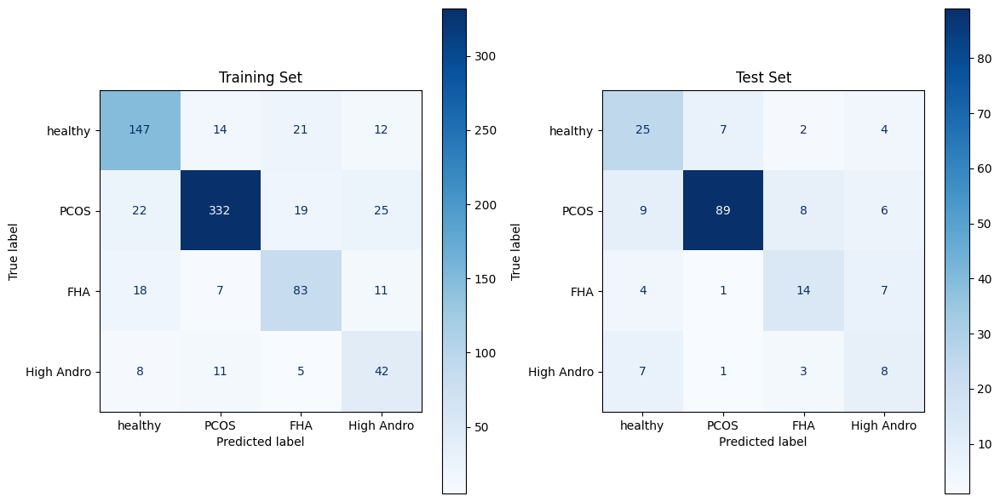

Training set
G-mean: 0.728
              precision    recall  f1-score   support

     healthy       0.75      0.76      0.76       194
        PCOS       0.91      0.83      0.87       398
         FHA       0.65      0.70      0.67       119
  High Andro       0.47      0.64      0.54        66

    accuracy                           0.78       777
   macro avg       0.70      0.73      0.71       777
weighted avg       0.79      0.78      0.78       777

G-mean: 0.587
Test set
              precision    recall  f1-score   support

     healthy       0.56      0.66      0.60        38
        PCOS       0.91      0.79      0.85       112
         FHA       0.52      0.54      0.53        26
  High Andro       0.32      0.42      0.36        19

    accuracy                           0.70       195
   macro avg       0.58      0.60      0.59       195
weighted avg       0.73      0.70      0.71       195



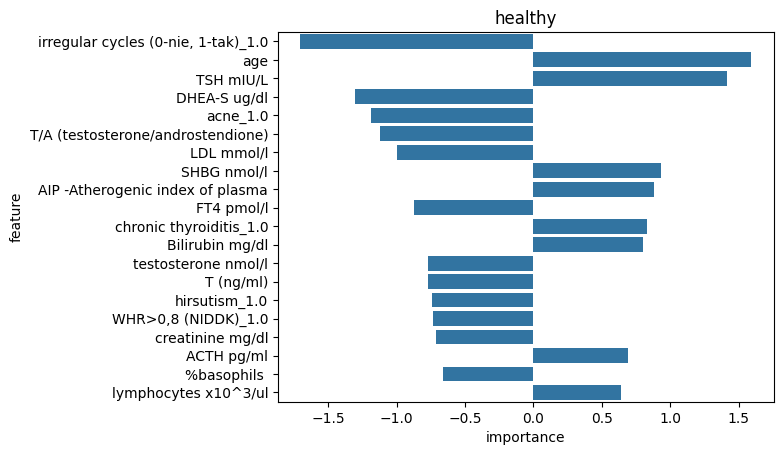

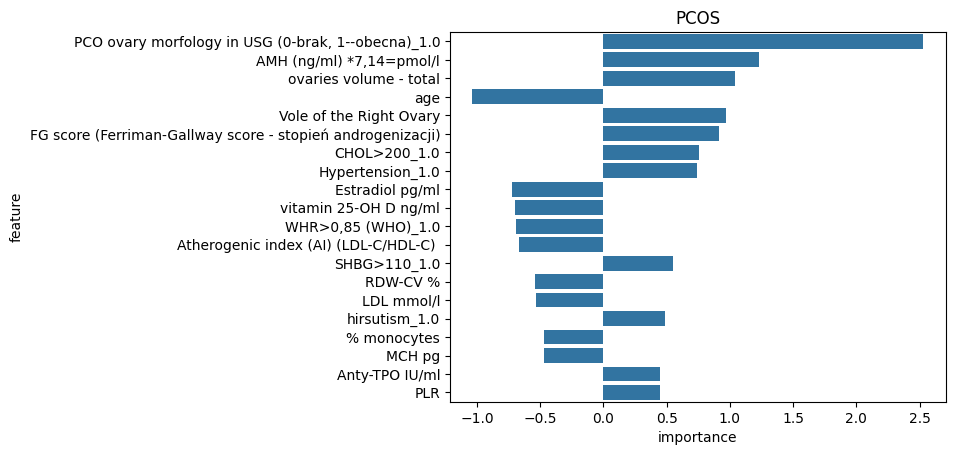

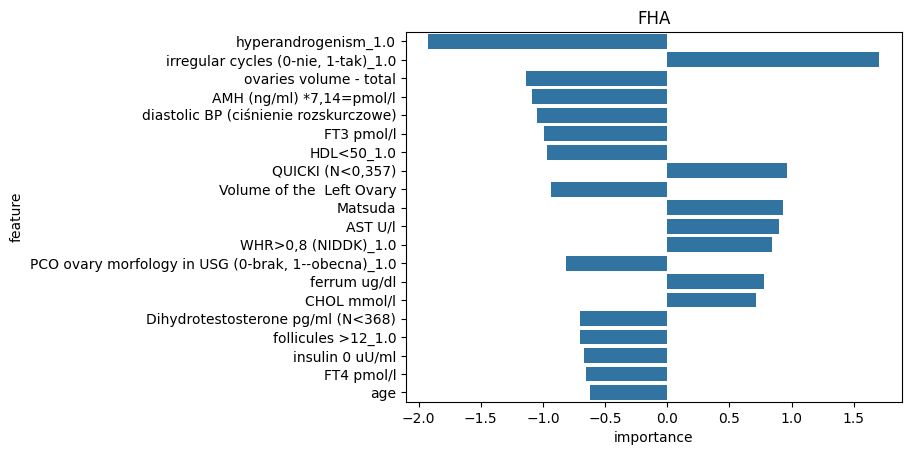

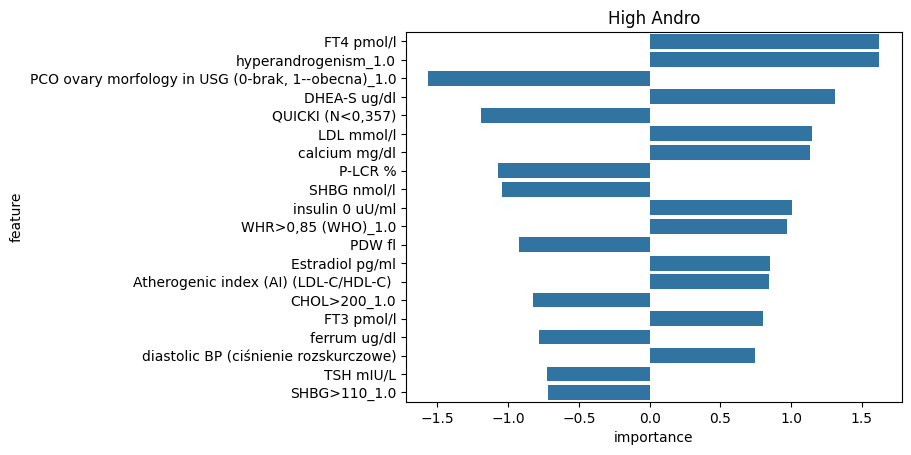

In [44]:
model_lr = LogisticRegression(C=0.5, multi_class='multinomial', max_iter=100000, n_jobs=-1)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train, y_train, X_test, y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_logistic_regressison)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


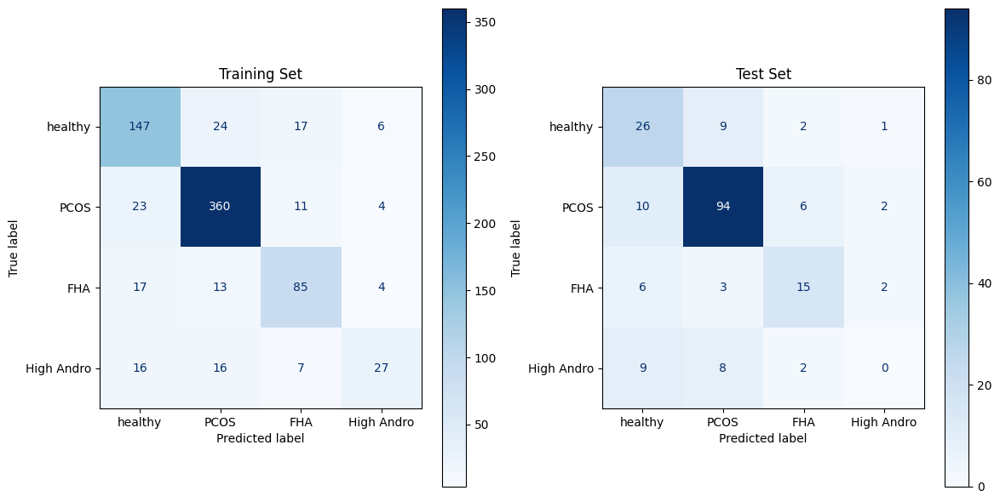

Training set
G-mean: 0.669
              precision    recall  f1-score   support

     healthy       0.72      0.76      0.74       194
        PCOS       0.87      0.90      0.89       398
         FHA       0.71      0.71      0.71       119
  High Andro       0.66      0.41      0.50        66

    accuracy                           0.80       777
   macro avg       0.74      0.70      0.71       777
weighted avg       0.79      0.80      0.79       777

G-mean: 0.0
Test set
              precision    recall  f1-score   support

     healthy       0.51      0.68      0.58        38
        PCOS       0.82      0.84      0.83       112
         FHA       0.60      0.58      0.59        26
  High Andro       0.00      0.00      0.00        19

    accuracy                           0.69       195
   macro avg       0.48      0.53      0.50       195
weighted avg       0.65      0.69      0.67       195



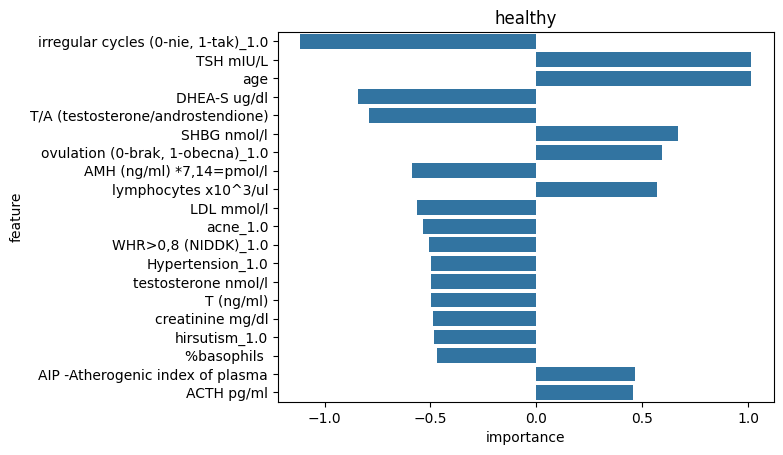

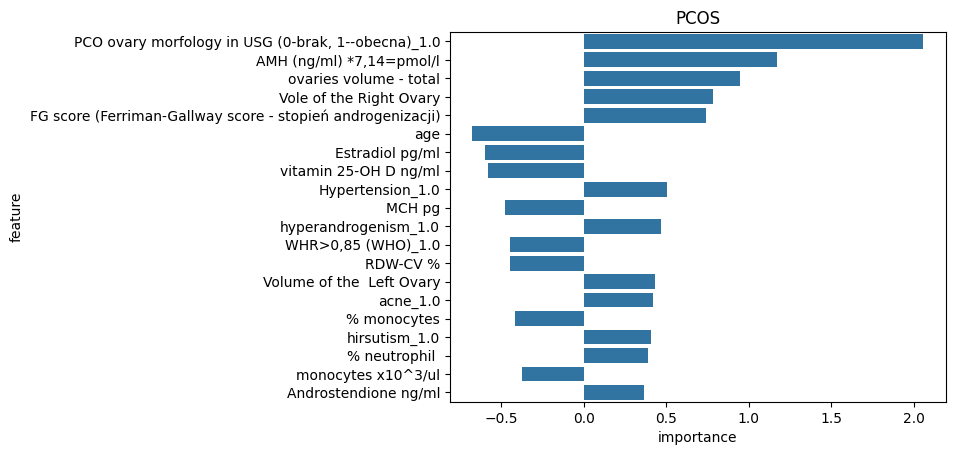

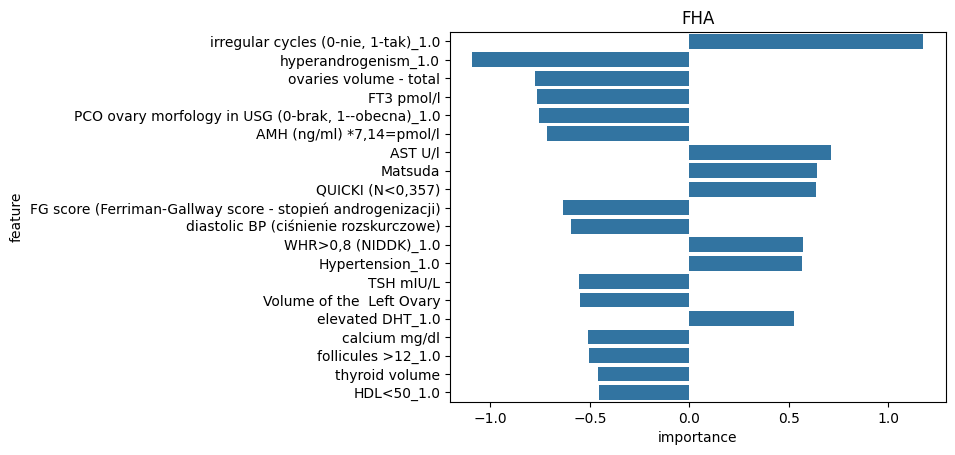

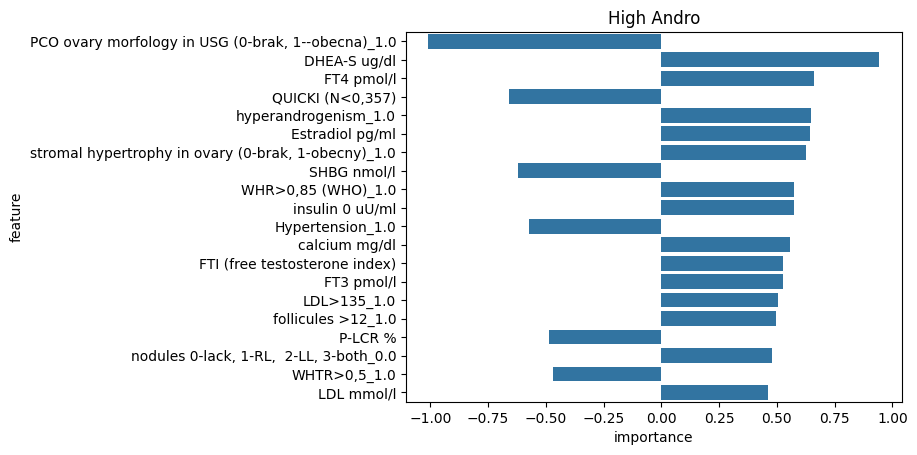

In [24]:
model_lr = LogisticRegression(C=0.5, multi_class='multinomial', max_iter=100000, n_jobs=-1)

feature_importnces_lr, pipeline_tlr = validate_model_classification(model_lr, PCO, CLASS_NAMES, X_train, y_train, X_test, y_test, continuous_preprocessor, categorical_preprocessor, get_feature_importance_logistic_regressison)

### KNN

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


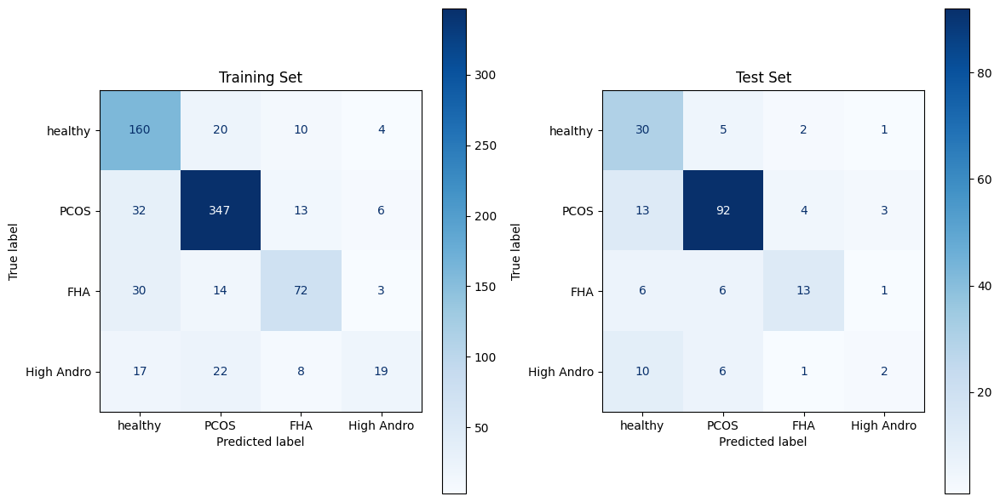

Training set
G-mean: 0.595
              precision    recall  f1-score   support

     healthy       0.67      0.82      0.74       194
        PCOS       0.86      0.87      0.87       398
         FHA       0.70      0.61      0.65       119
  High Andro       0.59      0.29      0.39        66

    accuracy                           0.77       777
   macro avg       0.71      0.65      0.66       777
weighted avg       0.77      0.77      0.76       777

G-mean: 0.43
Test set
              precision    recall  f1-score   support

     healthy       0.51      0.79      0.62        38
        PCOS       0.84      0.82      0.83       112
         FHA       0.65      0.50      0.57        26
  High Andro       0.29      0.11      0.15        19

    accuracy                           0.70       195
   macro avg       0.57      0.55      0.54       195
weighted avg       0.70      0.70      0.69       195



In [17]:
model_lr = KNeighborsClassifier()
feature_importnces_lr, pipeline_tlr = validate_model_classification(model_lr, PCO, CLASS_NAMES, X_train, y_train, X_test, y_test, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


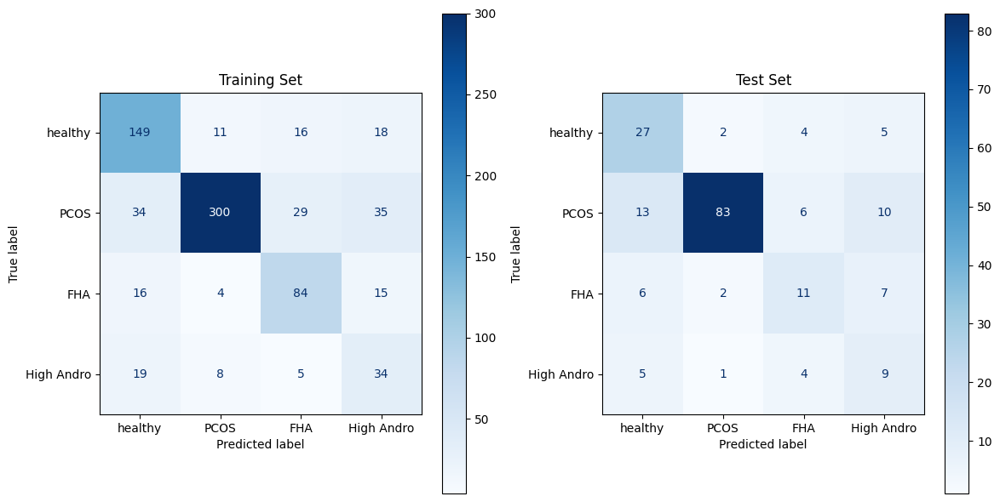

Training set
G-mean: 0.677
              precision    recall  f1-score   support

     healthy       0.68      0.77      0.72       194
        PCOS       0.93      0.75      0.83       398
         FHA       0.63      0.71      0.66       119
  High Andro       0.33      0.52      0.40        66

    accuracy                           0.73       777
   macro avg       0.64      0.69      0.66       777
weighted avg       0.77      0.73      0.74       777

G-mean: 0.57
Test set
              precision    recall  f1-score   support

     healthy       0.53      0.71      0.61        38
        PCOS       0.94      0.74      0.83       112
         FHA       0.44      0.42      0.43        26
  High Andro       0.29      0.47      0.36        19

    accuracy                           0.67       195
   macro avg       0.55      0.59      0.56       195
weighted avg       0.73      0.67      0.69       195



In [45]:
model_lr = KNeighborsClassifier(n_neighbors=5)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train, y_train, X_test, y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_knn)

## Feature importance

In [9]:
selected_features_map = {}

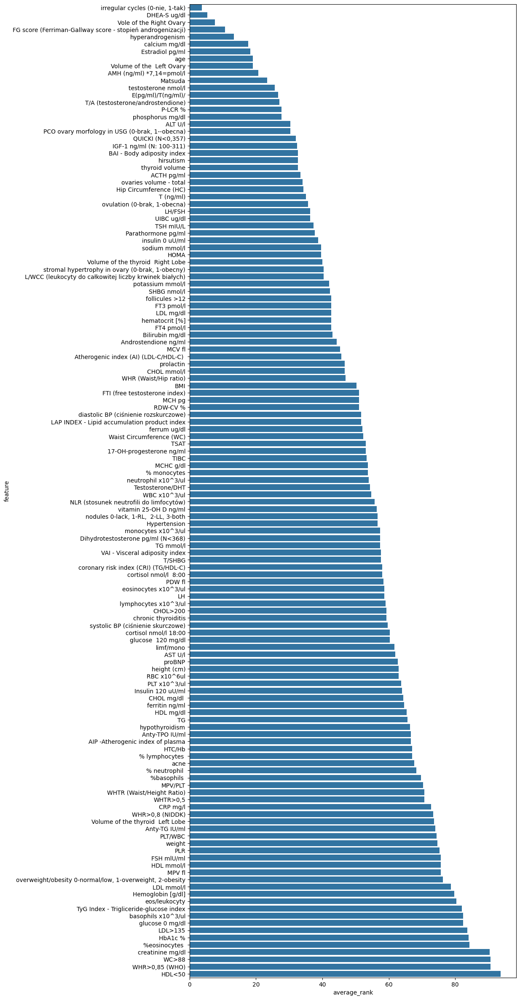

In [13]:
rename_importnace_col(feature_importnces_lr, 'logistic regression')
rename_importnace_col(feature_importnces_tree, 'tree')
rename_importnace_col(feature_importnces_rf, 'random forest')

feature_importance_df = merge_feature_importances([feature_importnces_lr, feature_importnces_tree, feature_importnces_rf])
ranked_df = rank_importances(feature_importance_df)

ranked_df_sorted = ranked_df.sort_values(by='average_rank')


plt.figure(figsize=(10, 30))
sns.barplot(ranked_df_sorted, x="average_rank", y="feature")
plt.show()

In [14]:
overall_rank_top_features = ranked_df_sorted[ranked_df_sorted['average_rank'] < 40] # a cut found on the plot above
overall_rank_selected_features = list(overall_rank_top_features['feature'].values)

selected_features_map['average_rank'] = overall_rank_selected_features
print(f'Top {len(overall_rank_selected_features)} features:')
overall_rank_selected_features

Top 35 features:


['irregular cycles (0-nie, 1-tak)',
 'DHEA-S ug/dl',
 'Vole of the Right Ovary',
 'FG score (Ferriman-Gallway score - stopień androgenizacji)',
 'hyperandrogenism',
 'calcium mg/dl',
 'Estradiol pg/ml',
 'age',
 'Volume of the  Left Ovary',
 'AMH (ng/ml) *7,14=pmol/l',
 'Matsuda',
 'testosterone nmol/l',
 'E(pg/ml)/T(ng/ml)/',
 'T/A (testosterone/androstendione)',
 'P-LCR %',
 'phosphorus mg/dl',
 'ALT U/l',
 'PCO ovary morfology in USG (0-brak, 1--obecna)',
 'QUICKI (N<0,357)',
 'IGF-1 ng/ml (N: 100-311)',
 'BAI - Body adiposity index',
 'hirsutism',
 'thyroid volume',
 'ACTH pg/ml',
 'ovaries volume - total',
 'Hip Circumference (HC)',
 'T (ng/ml)',
 'ovulation (0-brak, 1-obecna)',
 'LH/FSH',
 'UIBC ug/dl',
 'TSH mIU/L',
 'Parathormone pg/ml',
 'insulin 0 uU/ml',
 'sodium mmol/l',
 'HOMA']

## Feature selection

### Chi 2

In [47]:


def feature_selection_chi2(feature_selection_model, target_attribute, continuous_preprocessor, categorical_preprocessor,  X_train, y_train, threshold=0.05, figsize=(10, 30)):
    categorical_attributes = list(set(get_categorical_attributes_except(target_attribute)) & set(X_train.columns))
    continuous_attributes = list(set(get_continuous_attributes_except(target_attribute)) & set(X_train.columns))

    preprocessor = ColumnTransformer(
        verbose_feature_names_out=False,
        transformers=[
            ('num', continuous_preprocessor, continuous_attributes),
            ('cat', categorical_preprocessor, categorical_attributes)
        ])
    pipeline = Pipeline([('preprocessor', preprocessor), ('feature_selection', feature_selection_model)])

    X_new = pipeline.fit_transform(X_train, y_train)

    feature_importances = dict(zip(preprocessor.get_feature_names_out(), feature_selection_model.pvalues_))
    sorted_importances = sorted(feature_importances.items(), key=lambda x: abs(x[1]), reverse=False)
    df_importances = pd.DataFrame(sorted_importances, columns=['feature', 'p_value'])

    original_feature_importance = get_original_feature_importance_df(df_importances, importance_label='p_value')
    original_feature_importance.sort_values(by='p_value', ascending=True, inplace=True)


    selected_features = original_feature_importance[original_feature_importance['p_value'] < threshold]
    selected_feature_names = list(selected_features['feature'].values)
    print(f'Selected {len(selected_feature_names)} features')

    # print(selected_feature_names)
    # selected_indices = feature_selection_model.get_support(indices=True)
    # selected_feature_names = [preprocessor.get_feature_names_out()[i] for i in selected_indices]

    plt.figure(figsize=figsize)
    sns.barplot(selected_features, x="p_value", y="feature", legend=False)
    plt.show()

    return selected_feature_names


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Selected 21 features


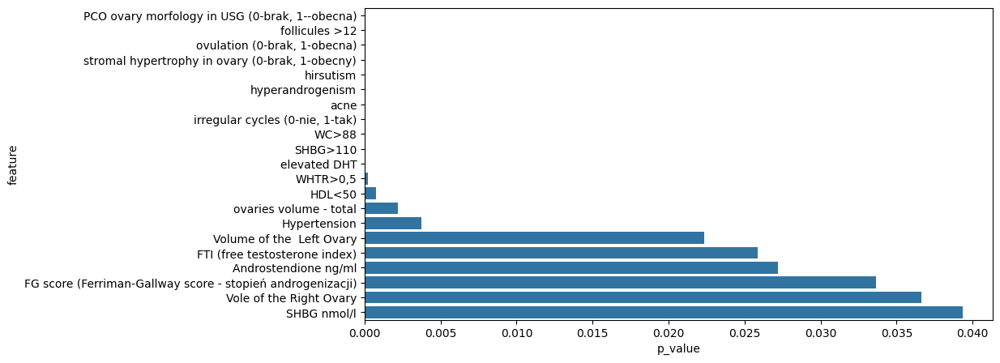

['PCO ovary morfology in USG (0-brak, 1--obecna)',
 'follicules >12',
 'ovulation (0-brak, 1-obecna)',
 'stromal hypertrophy in ovary (0-brak, 1-obecny)',
 'hirsutism',
 'hyperandrogenism',
 'acne',
 'irregular cycles (0-nie, 1-tak)',
 'WC>88',
 'SHBG>110',
 'elevated DHT',
 'WHTR>0,5',
 'HDL<50',
 'ovaries volume - total',
 'Hypertension',
 'Volume of the  Left Ovary',
 'FTI (free testosterone index)',
 'Androstendione ng/ml',
 'FG score (Ferriman-Gallway score - stopień androgenizacji)',
 'Vole of the Right Ovary',
 'SHBG nmol/l']

In [50]:
selected_features_chi2 = feature_selection_chi2(SelectKBest(chi2, k=15), PCO, continuous_preprocessor, categorical_preprocessor, X_train, y_train, figsize=(10, 5))
selected_features_map['chi_2'] = selected_features_chi2
selected_features_chi2

### Mutual info

In [12]:
def get_original_feature_importance_df(transformed_feature_importance_df, importance_label='importance', aggregation_method='sum'):
    transformed_feature_importance_df['original_feature'] = transformed_feature_importance_df['feature'].apply(lambda x: x.split('_')[0])
    if aggregation_method == 'sum':
        original_feature_importance_df = transformed_feature_importance_df.groupby('original_feature')[importance_label].sum().reset_index()
    if aggregation_method == 'mean':
        original_feature_importance_df = transformed_feature_importance_df.groupby('original_feature')[importance_label].mean().reset_index()
    original_feature_importance_df[importance_label] = original_feature_importance_df[importance_label].clip(upper=1)
    original_feature_importance_df.rename(columns={'original_feature': 'feature'}, inplace=True)

    return original_feature_importance_df.sort_values(by=importance_label, key=abs, ascending=False)



def feature_selection_mutual_info_classification(X_train, y_train, target_attribute, continuous_preprocessor, categorical_preprocessor, figsize=(10, 30)):
    categorical_attributes = list(set(get_categorical_attributes_except(target_attribute)) & set(X_train.columns))
    continuous_attributes = list(set(get_continuous_attributes_except(target_attribute)) & set(X_train.columns))

    preprocessor = ColumnTransformer(
    verbose_feature_names_out=False,
    transformers=[
        ('num', continuous_preprocessor, continuous_attributes),
        ('cat', categorical_preprocessor, categorical_attributes)
    ])

    pipeline = Pipeline([('preprocessor', preprocessor)])

    X_transformed = pipeline.fit_transform(X_train, y_train)

    mutual_info_scores = mutual_info_classif(X_transformed, y_train)
    feature_names = preprocessor.get_feature_names_out()

    feature_importances = pd.DataFrame({'feature': feature_names, 'mutual_info_score': mutual_info_scores})
    feature_importances_sorted = feature_importances.sort_values(by='mutual_info_score', key=abs, ascending=False)
    original_feature_importance = get_original_feature_importance_df(feature_importances_sorted, 'mutual_info_score')

    plt.figure(figsize=figsize)
    sns.barplot(original_feature_importance[original_feature_importance['mutual_info_score']>0], x="mutual_info_score", y="feature", legend=False)
    plt.show()

    return original_feature_importance


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


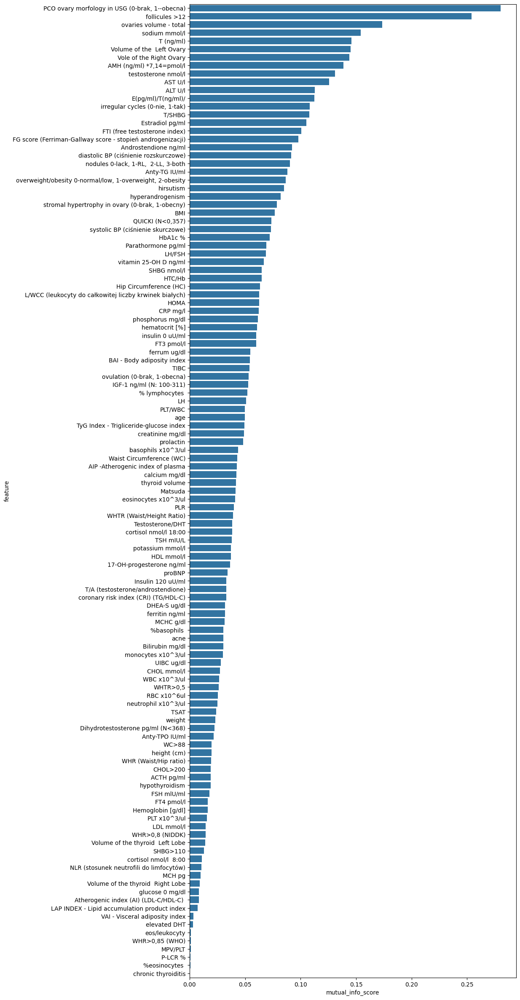

Selected 116 features


In [13]:
selected_feature_names_mutual_info = feature_selection_mutual_info_classification(X_train, y_train, PCO, continuous_preprocessor, categorical_preprocessor)
selected_feature_names_mutual_info = selected_feature_names_mutual_info[selected_feature_names_mutual_info['mutual_info_score'] > 0.001]

selected_feature_names_mutual_info.reset_index(drop=True, inplace=True)
print(f'Selected {len(selected_feature_names_mutual_info)} features')
selected_features_map['mutual_info'] = list(selected_feature_names_mutual_info['feature'].values)
# selected_feature_names_mutual_info

### Recursive Feature elimination

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Optimal number of features: 50


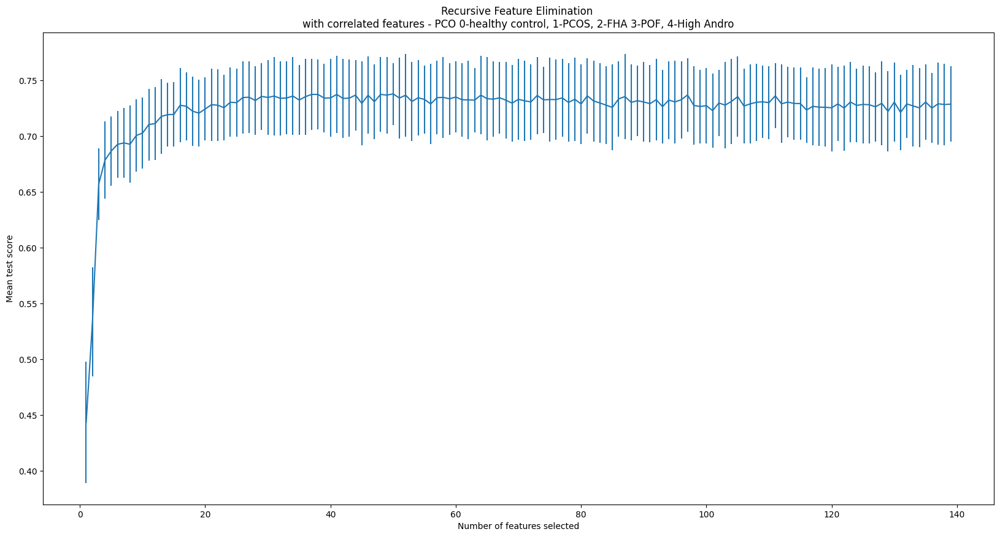

['SHBG nmol/l',
 'monocytes x10^3/ul',
 'HOMA',
 'irregular cycles (0-nie, 1-tak)',
 'insulin 0 uU/ml',
 'hyperandrogenism',
 'IGF-1 ng/ml (N: 100-311)',
 'follicules >12',
 'LDL mg/dl',
 'LH',
 'LH/FSH',
 'diastolic BP (ciśnienie rozskurczowe)',
 'cortisol nmol/l 18:00',
 'MCV fl',
 'calcium mg/dl',
 'Matsuda',
 'PCO ovary morfology in USG (0-brak, 1--obecna)',
 'QUICKI (N<0,357)',
 'Volume of the thyroid  Right Lobe',
 'vitamin 25-OH D ng/ml',
 'T (ng/ml)',
 'T/A (testosterone/androstendione)',
 'T/SHBG',
 'Volume of the  Left Ovary',
 'Vole of the Right Ovary',
 'TSAT',
 'TSH mIU/L',
 'Testosterone/DHT',
 'FTI (free testosterone index)',
 'FT4 pmol/l',
 'VAI - Visceral adiposity index',
 'proBNP',
 'FT3 pmol/l',
 'ALT U/l',
 'BAI - Body adiposity index',
 'sodium mmol/l',
 'Bilirubin mg/dl',
 'phosphorus mg/dl',
 'AMH (ng/ml) *7,14=pmol/l',
 'prolactin',
 'ovaries volume - total',
 'systolic BP (ciśnienie skurczowe)',
 'thyroid volume',
 'DHEA-S ug/dl',
 'Dihydrotestosterone pg/ml (

In [19]:
lasso_model = RandomForestClassifier(min_samples_leaf=7, min_samples_split=5, class_weight='balanced_subsample')

recursive_feature_elimination_ranked_features_lasso = recursive_feature_elimination(X_train, y_train, lasso_model, PCO, continuous_preprocessor, categorical_preprocessor, scoring_metric='f1_weighted')
selected_features_map['recursive_feature_elimination'] = list(recursive_feature_elimination_ranked_features_lasso[recursive_feature_elimination_ranked_features_lasso['ranking'] == 1]['feature'].values)
selected_features_map['recursive_feature_elimination']

### Gini index

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Selected 1 features


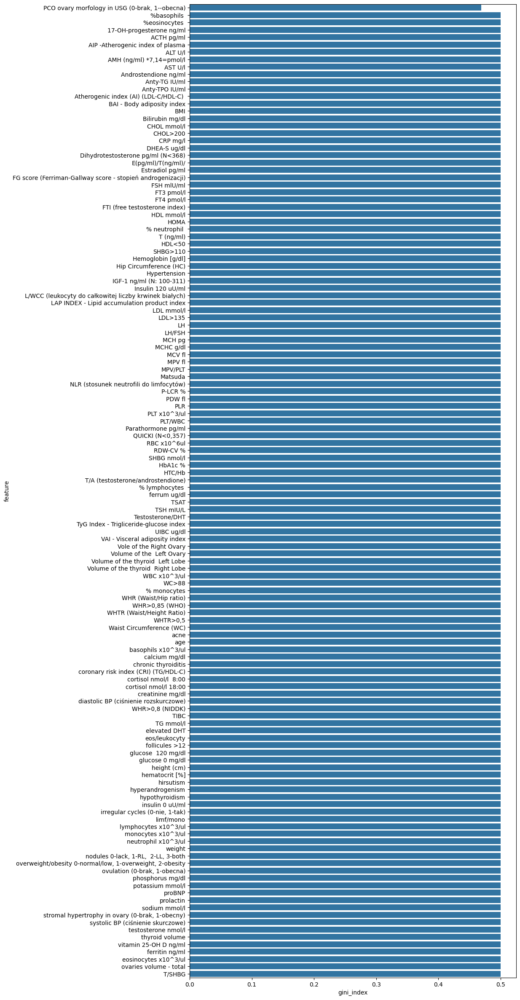

['PCO ovary morfology in USG (0-brak, 1--obecna)']

In [25]:
threshold = 0.5
gini_index_selected_features = feature_selection_gini_index(PCO, continuous_preprocessor, categorical_preprocessor, X_train, y_train, threshold=threshold)

#  NOTE: we don't consider it as a constraint because it would select either one feature or all of them
# selected_features_map['permutation_importance'] = gini_index_selected_features
gini_index_selected_features

### Permutation importance

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 123 features


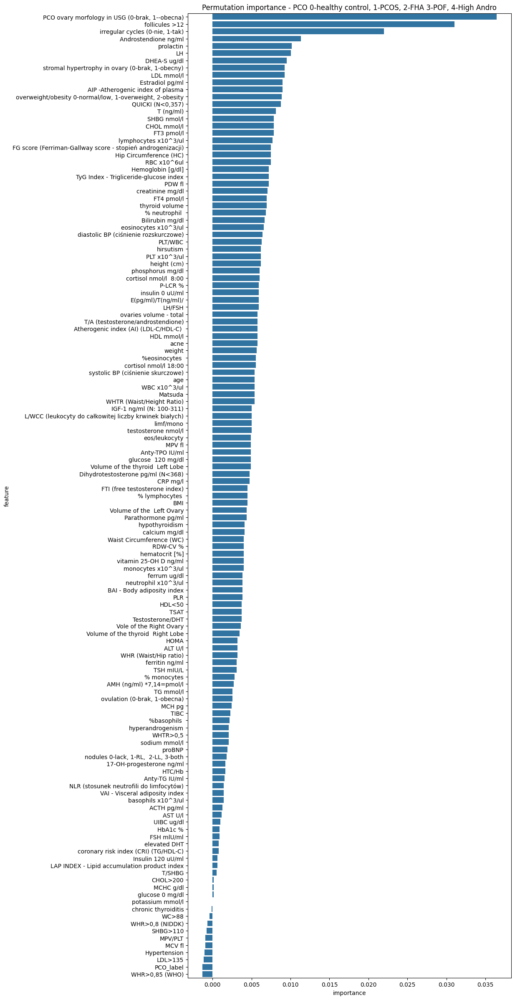

Actually selected 58 features


In [15]:
lasso_model = RandomForestClassifier(min_samples_leaf=7, min_samples_split=15, class_weight='balanced_subsample', n_jobs=-1)

selected_features_permutation_importance = get_permutation_importance(X_train, y_train, lasso_model, continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, PCO)
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.005]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)
print(f'Actually selected {len(selected_features_map['permutation_importance'])} features')
# selected_features_permutation_importance

In [16]:
intersection_all_sets = set(selected_features_map[next(iter(selected_features_map))])

for key, items in selected_features_map.items():
    intersection_all_sets.intersection_update(items)


intersection_all_sets = list(intersection_all_sets)
print(len(intersection_all_sets))
print(intersection_all_sets)

pd.DataFrame(intersection_all_sets)

10
['FG score (Ferriman-Gallway score - stopień androgenizacji)', 'follicules >12', 'stromal hypertrophy in ovary (0-brak, 1-obecny)', 'ovaries volume - total', 'acne', 'hirsutism', 'irregular cycles (0-nie, 1-tak)', 'PCO ovary morfology in USG (0-brak, 1--obecna)', 'SHBG nmol/l', 'Androstendione ng/ml']


,0
0,FG score (Ferriman-Gallway score - stopień androgenizacji)
1,follicules >12
2,"stromal hypertrophy in ovary (0-brak, 1-obecny)"
3,ovaries volume - total
4,acne
5,hirsutism
6,"irregular cycles (0-nie, 1-tak)"
7,"PCO ovary morfology in USG (0-brak, 1--obecna)"
8,SHBG nmol/l
9,Androstendione ng/ml


In [ ]:
union_all_sets = set(selected_features_map[next(iter(selected_features_map))]) 

for key, items in selected_features_map.items():
    union_all_sets.update(items)
    

union_all_sets = list(union_all_sets)
print(len(union_all_sets))
print(union_all_sets)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


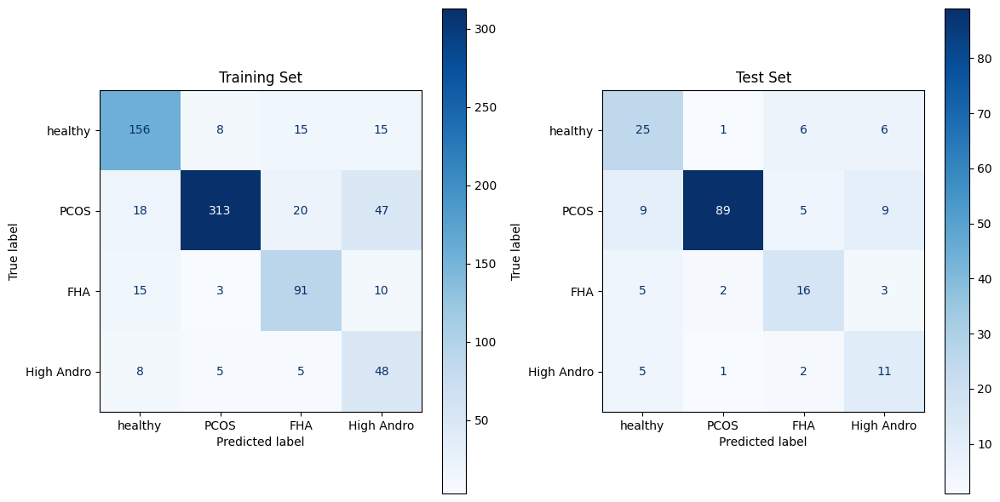

Training set
G-mean: 0.77
              precision    recall  f1-score   support

     healthy       0.79      0.80      0.80       194
        PCOS       0.95      0.79      0.86       398
         FHA       0.69      0.76      0.73       119
  High Andro       0.40      0.73      0.52        66

    accuracy                           0.78       777
   macro avg       0.71      0.77      0.73       777
weighted avg       0.83      0.78      0.80       777

G-mean: 0.657
Test set
              precision    recall  f1-score   support

     healthy       0.57      0.66      0.61        38
        PCOS       0.96      0.79      0.87       112
         FHA       0.55      0.62      0.58        26
  High Andro       0.38      0.58      0.46        19

    accuracy                           0.72       195
   macro avg       0.61      0.66      0.63       195
weighted avg       0.77      0.72      0.74       195



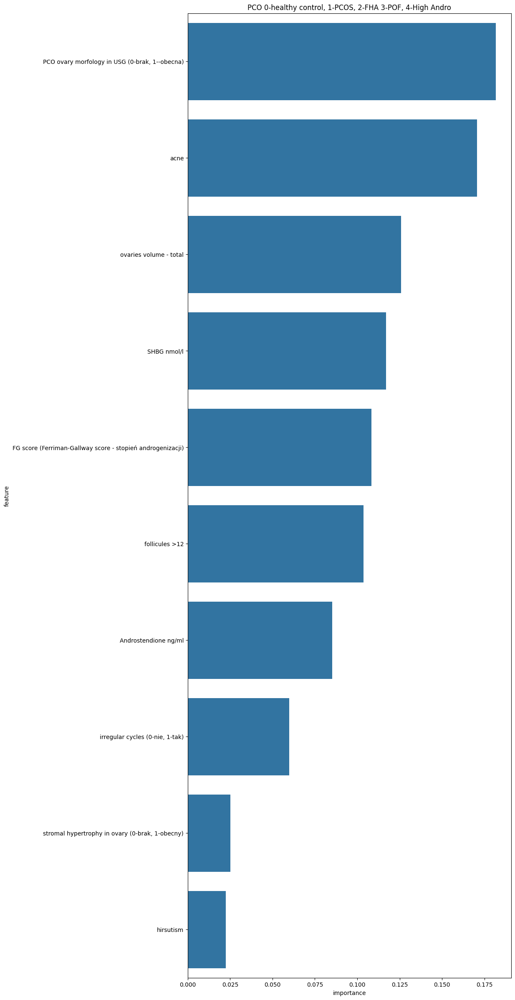

In [17]:
feature_subset = intersection_all_sets

model_rf = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight=None, random_state=72)


feature_importnces_rf, pipeline_rf = validate_model_classification_smote(model_rf, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_rf)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


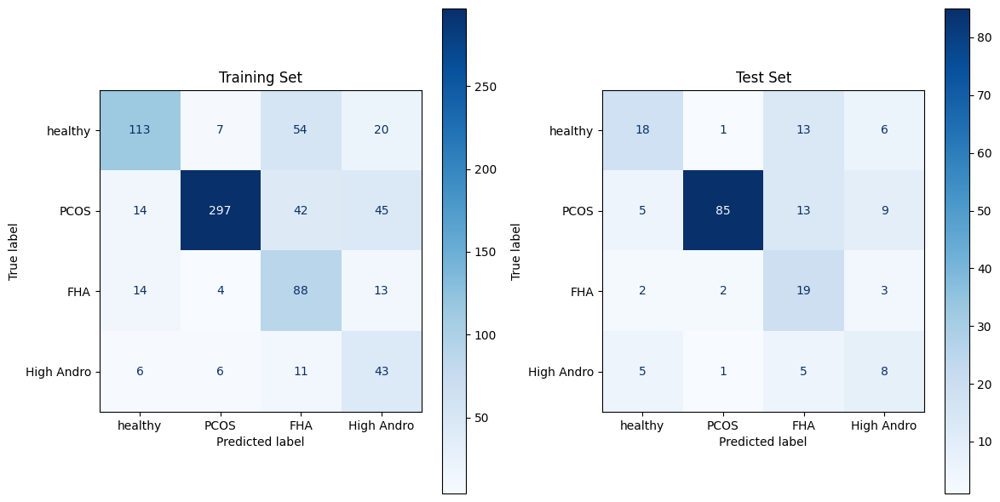

Training set
G-mean: 0.676
              precision    recall  f1-score   support

     healthy       0.77      0.58      0.66       194
        PCOS       0.95      0.75      0.83       398
         FHA       0.45      0.74      0.56       119
  High Andro       0.36      0.65      0.46        66

    accuracy                           0.70       777
   macro avg       0.63      0.68      0.63       777
weighted avg       0.78      0.70      0.72       777

G-mean: 0.577
Test set
              precision    recall  f1-score   support

     healthy       0.60      0.47      0.53        38
        PCOS       0.96      0.76      0.85       112
         FHA       0.38      0.73      0.50        26
  High Andro       0.31      0.42      0.36        19

    accuracy                           0.67       195
   macro avg       0.56      0.60      0.56       195
weighted avg       0.75      0.67      0.69       195



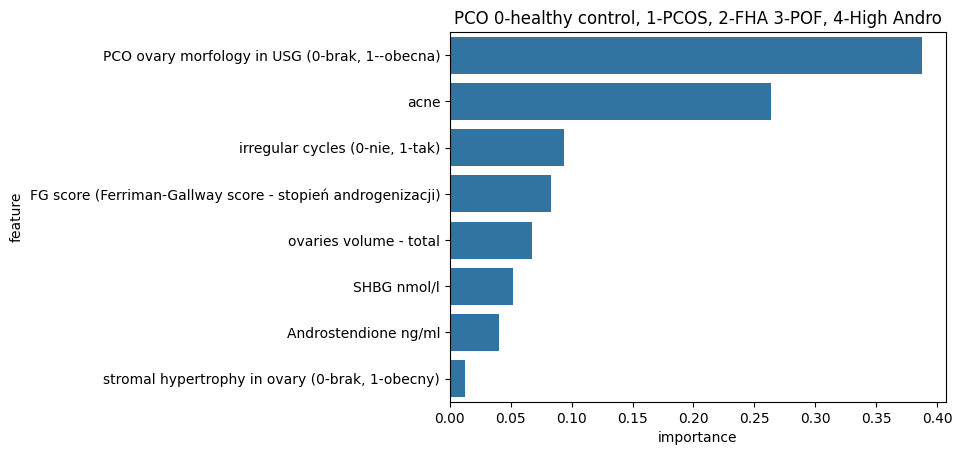

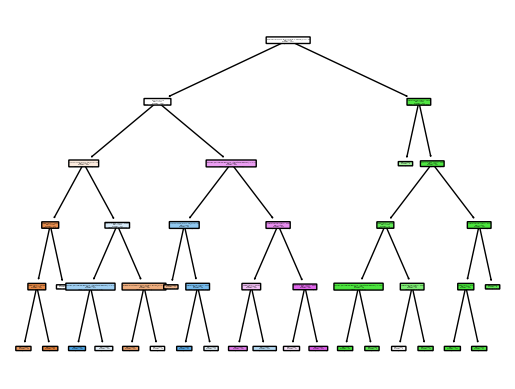

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


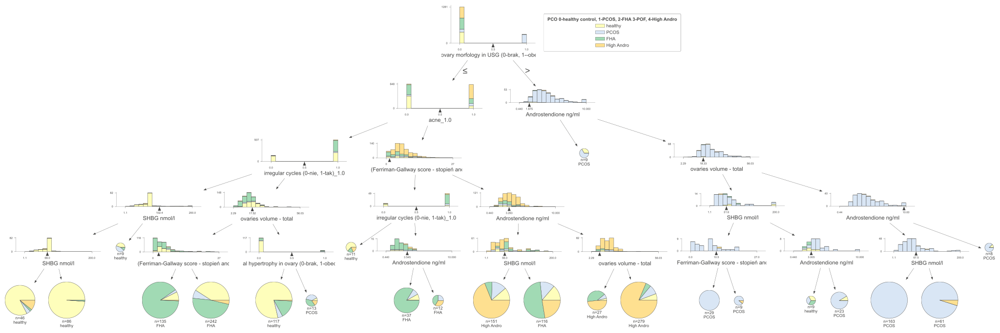

In [18]:

model_tree = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight=None)

feature_importnces_tree, pipeline_tree = validate_model_classification_smote(model_tree, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_tree)

plot_fancy_tree_smote(pipeline_tree, X_train, y_train, PCO, show_artificial_data=True, class_names=CLASS_NAMES)


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


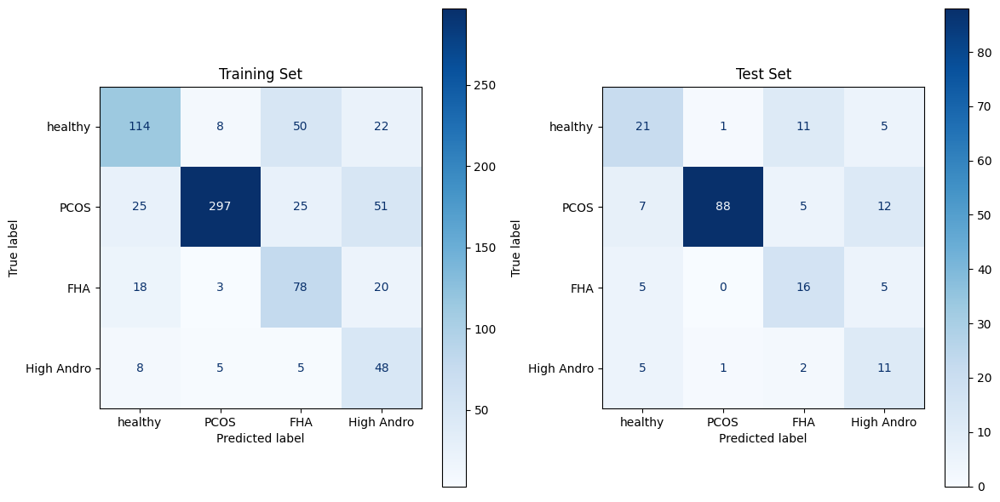

Training set
G-mean: 0.676
              precision    recall  f1-score   support

     healthy       0.69      0.59      0.64       194
        PCOS       0.95      0.75      0.84       398
         FHA       0.49      0.66      0.56       119
  High Andro       0.34      0.73      0.46        66

    accuracy                           0.69       777
   macro avg       0.62      0.68      0.62       777
weighted avg       0.76      0.69      0.71       777

G-mean: 0.627
Test set
              precision    recall  f1-score   support

     healthy       0.55      0.55      0.55        38
        PCOS       0.98      0.79      0.87       112
         FHA       0.47      0.62      0.53        26
  High Andro       0.33      0.58      0.42        19

    accuracy                           0.70       195
   macro avg       0.58      0.63      0.60       195
weighted avg       0.76      0.70      0.72       195



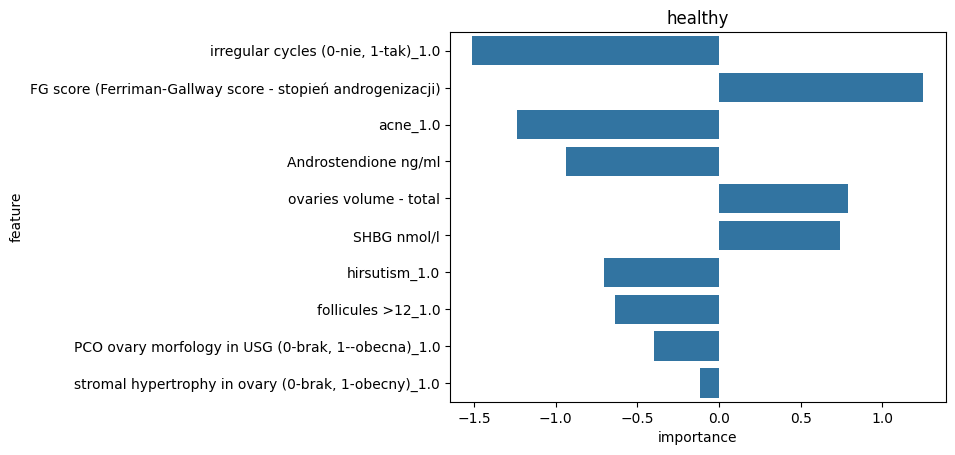

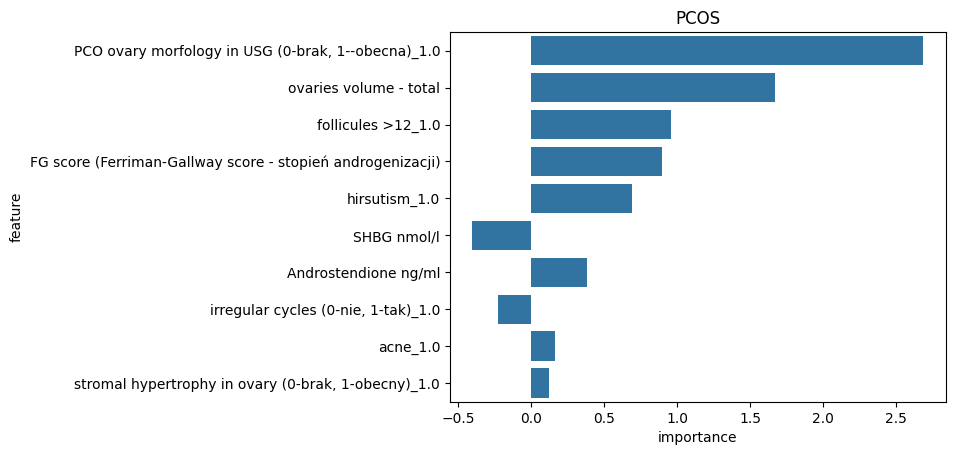

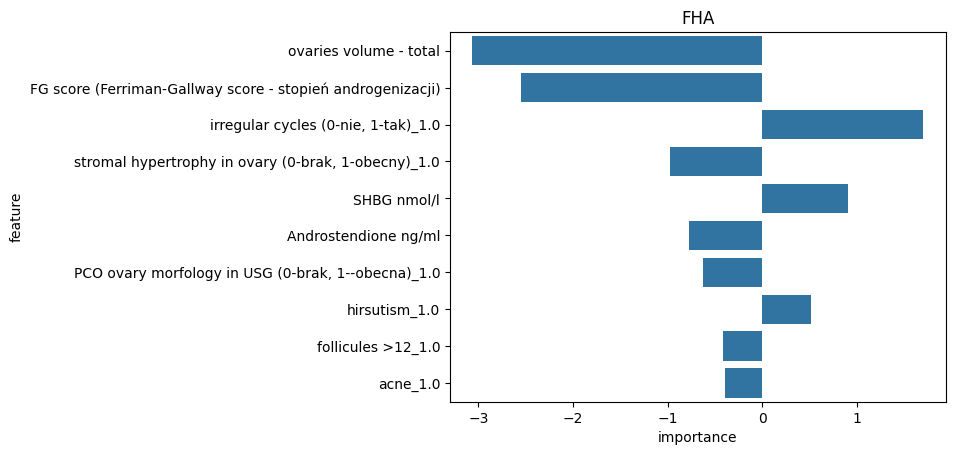

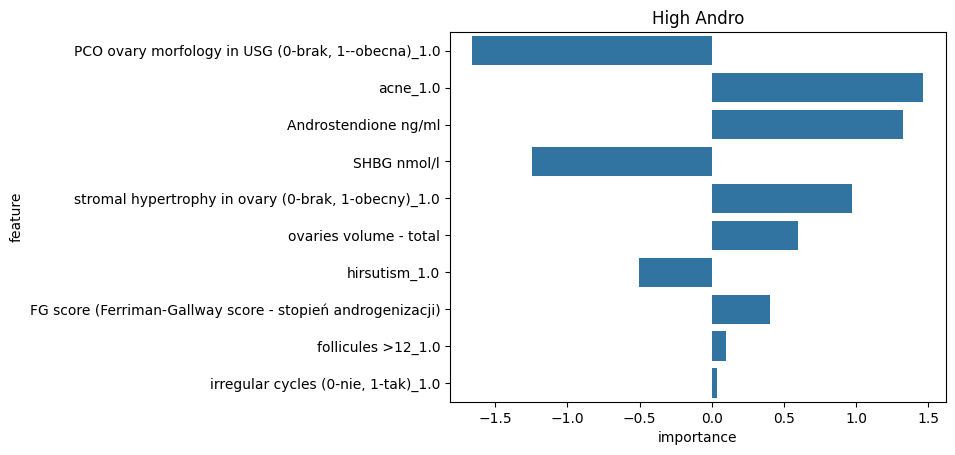

In [19]:


model_lr = LogisticRegression(C=0.5, multi_class='multinomial', max_iter=100000, n_jobs=-1)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_logistic_regressison)

In [ ]:
feature_subset = intersection_all_sets
model_lr = KNeighborsClassifier(n_neighbors=5)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_knn)

## SFS

### Mutual info


In [39]:
len(selected_features_map['mutual_info'])

116

In [21]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS


sfs = SFS(
    estimator = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight=None), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring=gmean_scorer,
    cv=3,
    n_jobs=-1
)

sfs = sfs.fit(X_train[selected_features_map['mutual_info']], y_train)

best_features = sfs.get_feature_names_out()
len(best_features), best_features

(115,
 array(['PCO ovary morfology in USG (0-brak, 1--obecna)', 'follicules >12',
        'ovaries volume - total', 'sodium mmol/l', 'T (ng/ml)',
        'Volume of the  Left Ovary', 'Vole of the Right Ovary',
        'AMH (ng/ml) *7,14=pmol/l', 'testosterone nmol/l', 'AST U/l',
        'ALT U/l', 'E(pg/ml)/T(ng/ml)/', 'irregular cycles (0-nie, 1-tak)',
        'T/SHBG', 'Estradiol pg/ml', 'FTI (free testosterone index)',
        'FG score (Ferriman-Gallway score - stopień androgenizacji)',
        'Androstendione ng/ml', 'diastolic BP (ciśnienie rozskurczowe)',
        'nodules 0-lack, 1-RL,  2-LL, 3-both', 'Anty-TG IU/ml',
        'overweight/obesity 0-normal/low, 1-overweight, 2-obesity',
        'hyperandrogenism',
        'stromal hypertrophy in ovary (0-brak, 1-obecny)', 'BMI',
        'QUICKI (N<0,357)', 'systolic BP (ciśnienie skurczowe)', 'HbA1c %',
        'Parathormone pg/ml', 'LH/FSH', 'vitamin 25-OH D ng/ml',
        'SHBG nmol/l', 'HTC/Hb', 'Hip Circumference (HC)',
     

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


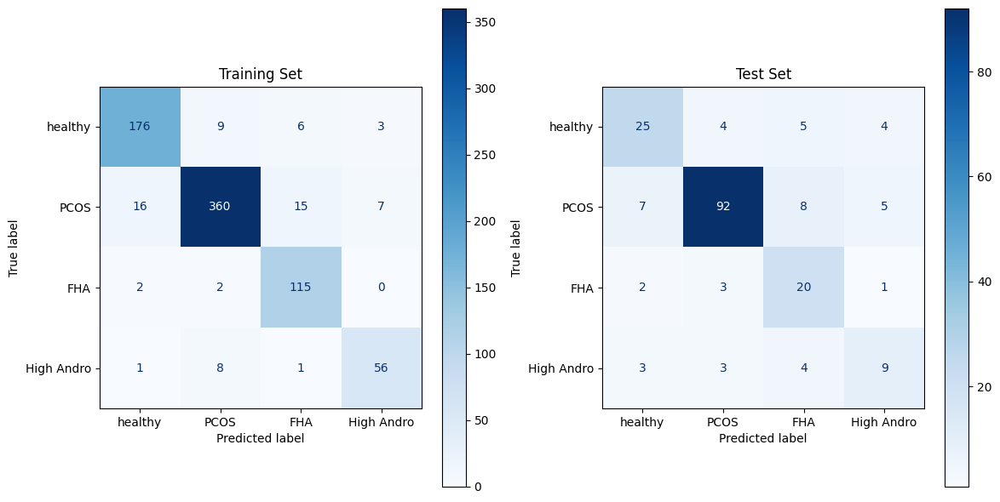

Training set
G-mean: 0.906
              precision    recall  f1-score   support

     healthy       0.90      0.91      0.90       194
        PCOS       0.95      0.90      0.93       398
         FHA       0.84      0.97      0.90       119
  High Andro       0.85      0.85      0.85        66

    accuracy                           0.91       777
   macro avg       0.89      0.91      0.89       777
weighted avg       0.91      0.91      0.91       777

G-mean: 0.666
Test set
              precision    recall  f1-score   support

     healthy       0.68      0.66      0.67        38
        PCOS       0.90      0.82      0.86       112
         FHA       0.54      0.77      0.63        26
  High Andro       0.47      0.47      0.47        19

    accuracy                           0.75       195
   macro avg       0.65      0.68      0.66       195
weighted avg       0.77      0.75      0.75       195



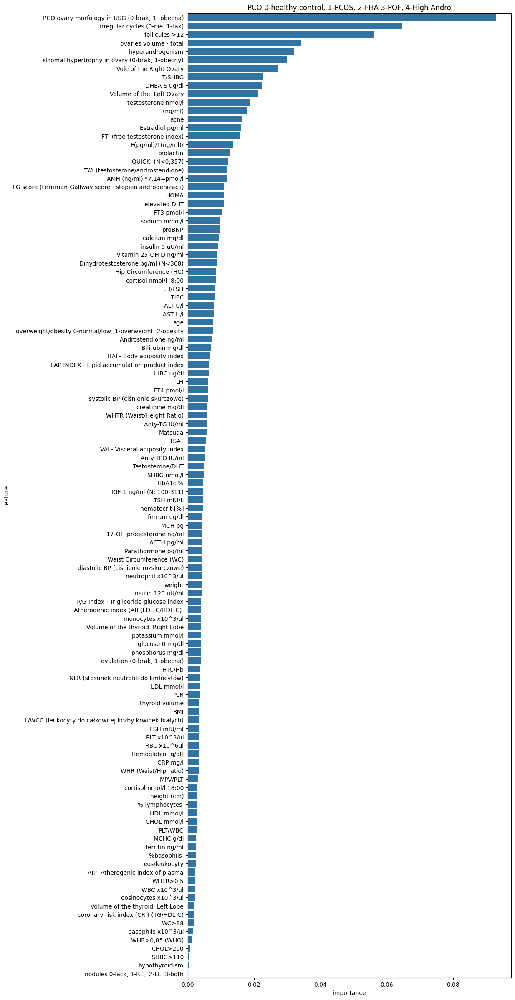

In [22]:
feature_subset = best_features

model_rf = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight=None, random_state=72)


feature_importnces_rf, pipeline_rf = validate_model_classification_smote(model_rf, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_rf)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


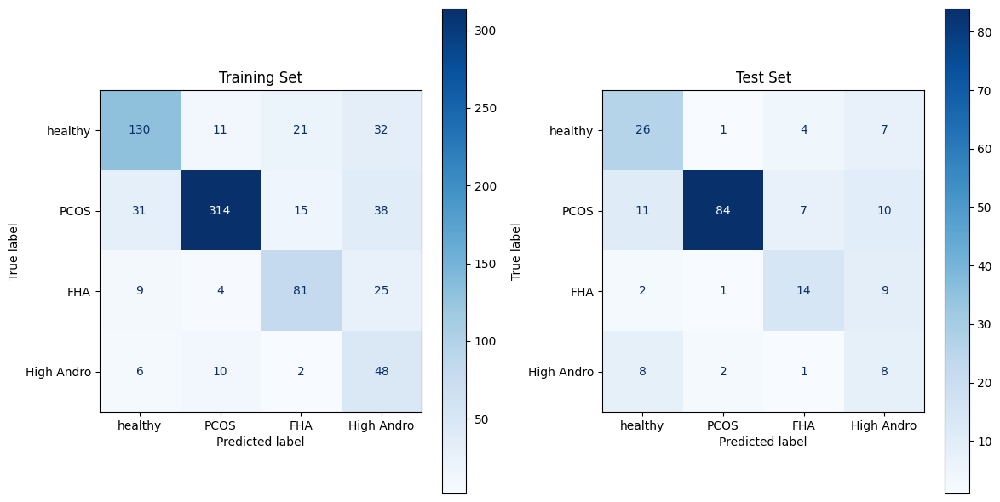

Training set
G-mean: 0.715
              precision    recall  f1-score   support

     healthy       0.74      0.67      0.70       194
        PCOS       0.93      0.79      0.85       398
         FHA       0.68      0.68      0.68       119
  High Andro       0.34      0.73      0.46        66

    accuracy                           0.74       777
   macro avg       0.67      0.72      0.67       777
weighted avg       0.79      0.74      0.76       777

G-mean: 0.584
Test set
              precision    recall  f1-score   support

     healthy       0.55      0.68      0.61        38
        PCOS       0.95      0.75      0.84       112
         FHA       0.54      0.54      0.54        26
  High Andro       0.24      0.42      0.30        19

    accuracy                           0.68       195
   macro avg       0.57      0.60      0.57       195
weighted avg       0.75      0.68      0.70       195



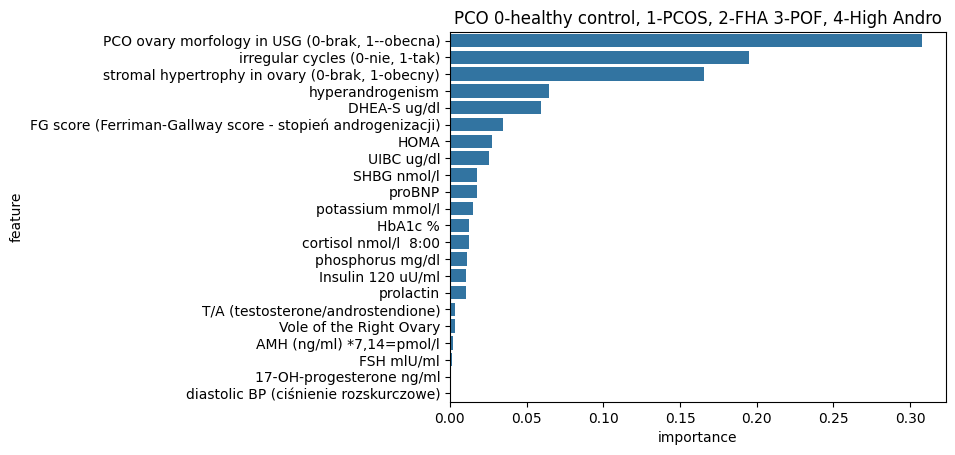

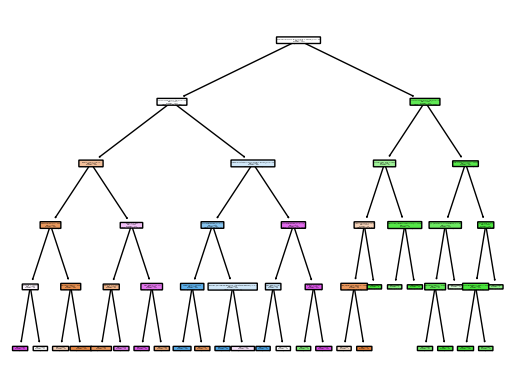

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


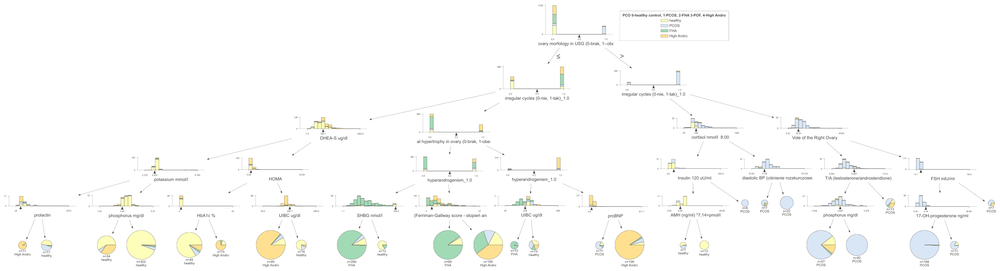

In [23]:
feature_subset = best_features

model_tree = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight=None)

feature_importnces_tree, pipeline_tree = validate_model_classification_smote(model_tree, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_tree)

plot_fancy_tree_smote(pipeline_tree, X_train, y_train, PCO, show_artificial_data=True, class_names=CLASS_NAMES)


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


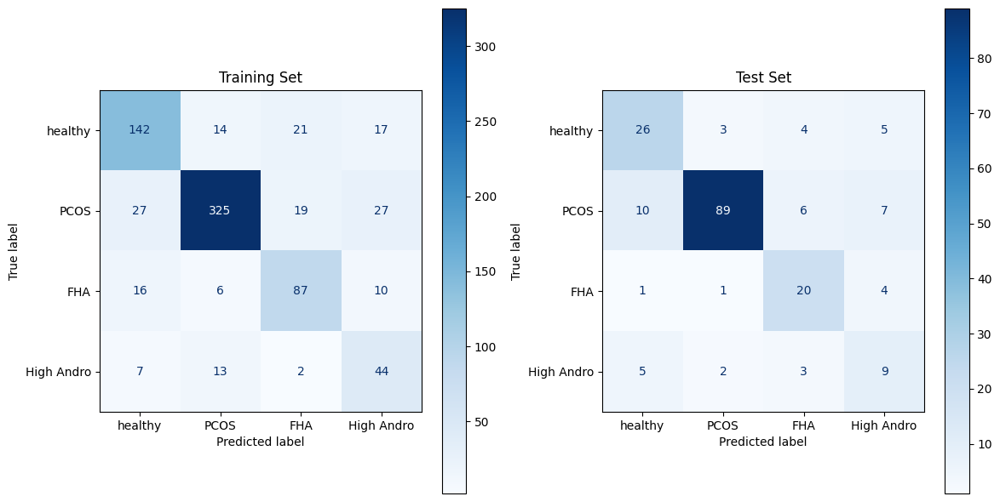

Training set
G-mean: 0.735
              precision    recall  f1-score   support

     healthy       0.74      0.73      0.74       194
        PCOS       0.91      0.82      0.86       398
         FHA       0.67      0.73      0.70       119
  High Andro       0.45      0.67      0.54        66

    accuracy                           0.77       777
   macro avg       0.69      0.74      0.71       777
weighted avg       0.79      0.77      0.78       777

G-mean: 0.667
Test set
              precision    recall  f1-score   support

     healthy       0.62      0.68      0.65        38
        PCOS       0.94      0.79      0.86       112
         FHA       0.61      0.77      0.68        26
  High Andro       0.36      0.47      0.41        19

    accuracy                           0.74       195
   macro avg       0.63      0.68      0.65       195
weighted avg       0.77      0.74      0.75       195



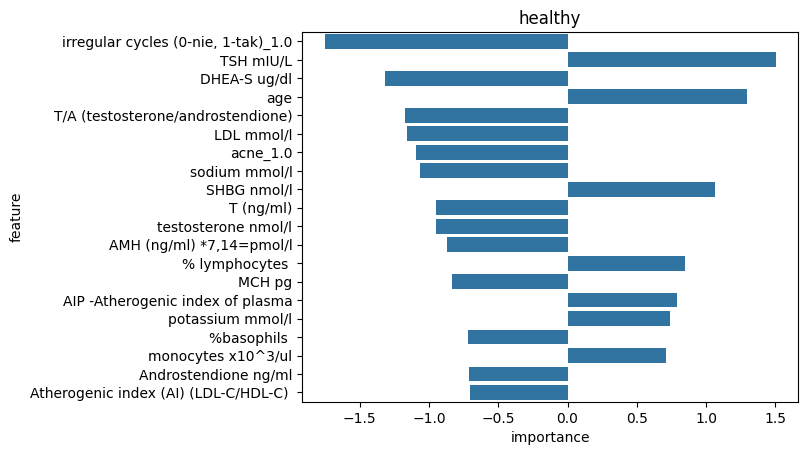

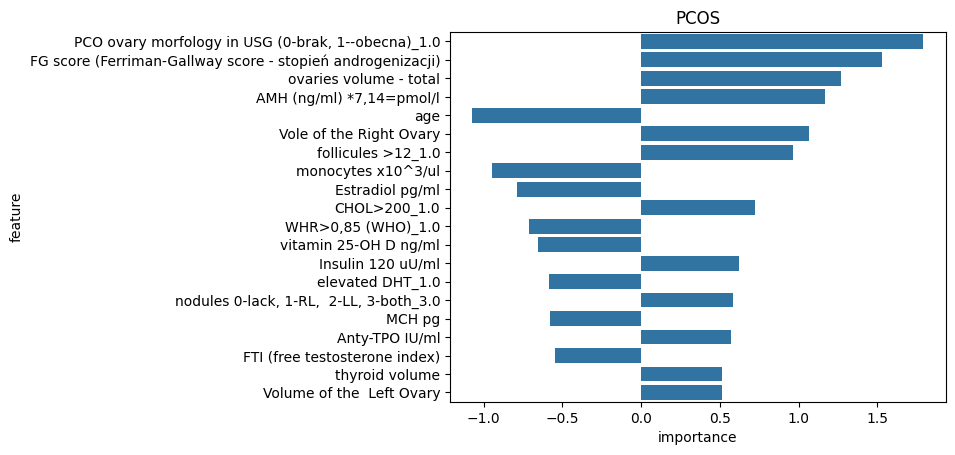

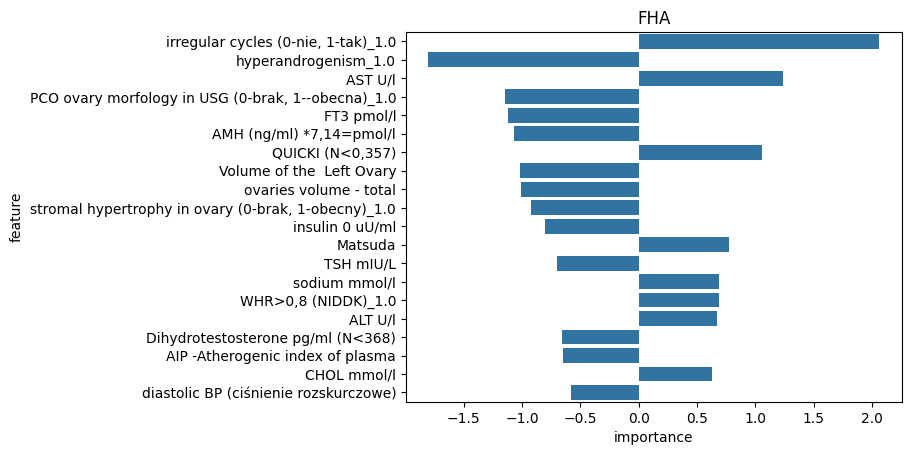

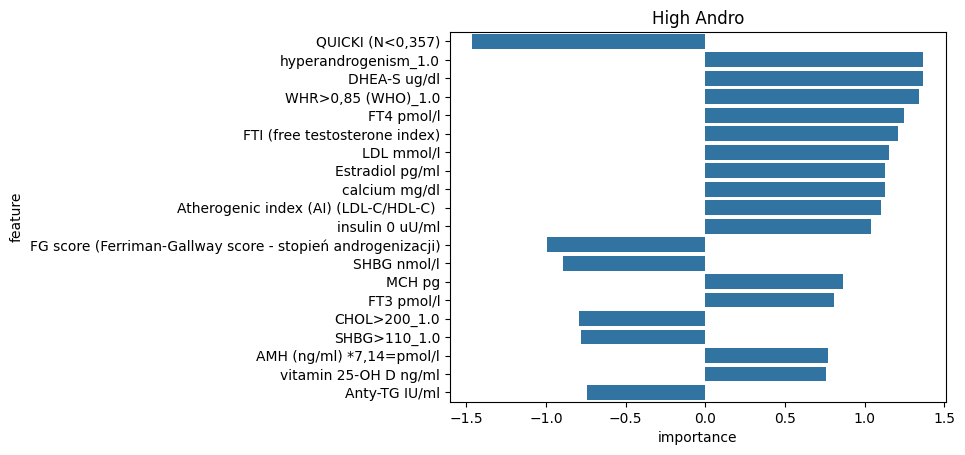

In [24]:
feature_subset = best_features

model_lr = LogisticRegression(C=0.5, multi_class='multinomial', max_iter=100000, n_jobs=-1)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_logistic_regressison)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


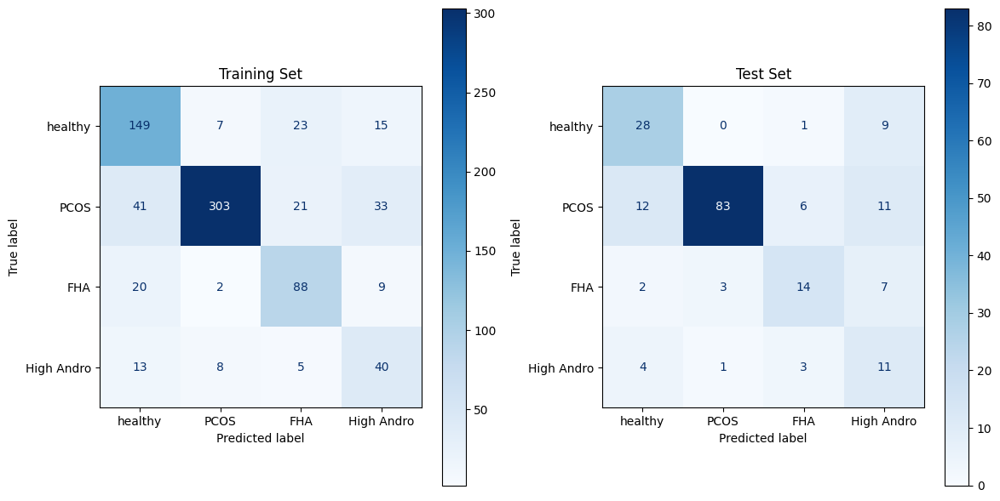

Training set
G-mean: 0.715
              precision    recall  f1-score   support

     healthy       0.67      0.77      0.71       194
        PCOS       0.95      0.76      0.84       398
         FHA       0.64      0.74      0.69       119
  High Andro       0.41      0.61      0.49        66

    accuracy                           0.75       777
   macro avg       0.67      0.72      0.68       777
weighted avg       0.79      0.75      0.76       777

G-mean: 0.642
Test set
              precision    recall  f1-score   support

     healthy       0.61      0.74      0.67        38
        PCOS       0.95      0.74      0.83       112
         FHA       0.58      0.54      0.56        26
  High Andro       0.29      0.58      0.39        19

    accuracy                           0.70       195
   macro avg       0.61      0.65      0.61       195
weighted avg       0.77      0.70      0.72       195



In [25]:
feature_subset = best_features

model_lr = KNeighborsClassifier(n_neighbors=5)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_knn)

### Permutation importance

In [40]:
len(selected_features_map['permutation_importance'])

58

In [27]:

sfs = SFS(
    estimator = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight=None), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring=gmean_scorer,
    cv=3,
    n_jobs=-1
)

sfs = sfs.fit(X_train[selected_features_map['permutation_importance']], y_train)

best_features_permutation = sfs.get_feature_names_out()
len(best_features_permutation), best_features_permutation

(57,
 array(['PCO ovary morfology in USG (0-brak, 1--obecna)', 'follicules >12',
        'irregular cycles (0-nie, 1-tak)', 'Androstendione ng/ml',
        'prolactin', 'LH', 'DHEA-S ug/dl',
        'stromal hypertrophy in ovary (0-brak, 1-obecny)', 'LDL mmol/l',
        'Estradiol pg/ml', 'AIP -Atherogenic index of plasma',
        'overweight/obesity 0-normal/low, 1-overweight, 2-obesity',
        'QUICKI (N<0,357)', 'T (ng/ml)', 'SHBG nmol/l', 'CHOL mmol/l',
        'FT3 pmol/l', 'lymphocytes x10^3/ul',
        'FG score (Ferriman-Gallway score - stopień androgenizacji)',
        'Hip Circumference (HC)', 'RBC x10^6ul', 'Hemoglobin [g/dl]',
        'TyG Index - Trigliceride-glucose index', 'PDW fl',
        'creatinine mg/dl', 'FT4 pmol/l', 'thyroid volume',
        '% neutrophil ', 'Bilirubin mg/dl', 'eosinocytes x10^3/ul',
        'diastolic BP (ciśnienie rozskurczowe)', 'PLT/WBC', 'hirsutism',
        'PLT x10^3/ul', 'height (cm)', 'phosphorus mg/dl',
        'cortisol nmol/l  8:

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 57 features


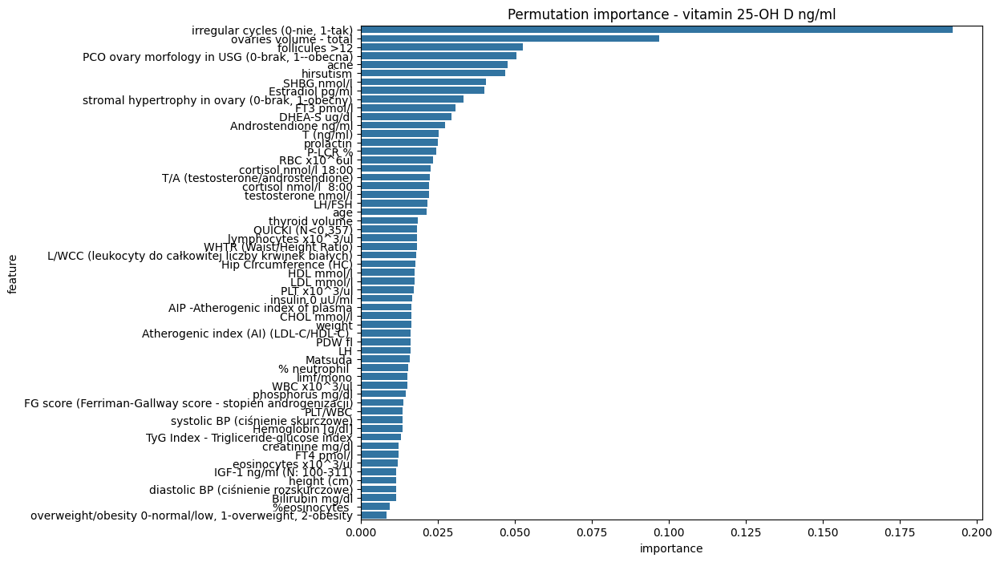

In [37]:
selected_features_permutation_importance = get_permutation_importance(X_train[best_features_permutation], y_train, RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=3, min_samples_split=3, criterion='absolute_error', random_state=56), continuous_preprocessor, categorical_preprocessor, VITAMINE_D, figsize=(10, 8))
# selected_features_permutation_importance

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


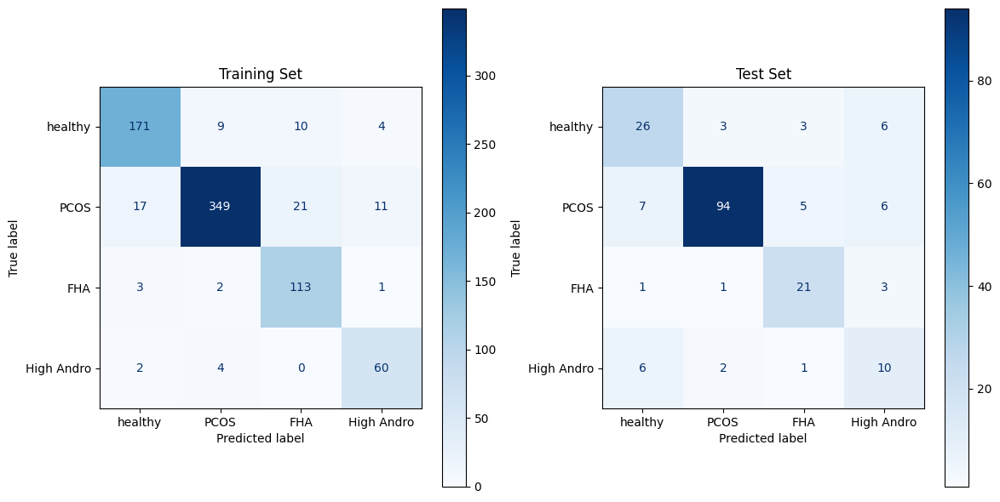

Training set
G-mean: 0.904
              precision    recall  f1-score   support

     healthy       0.89      0.88      0.88       194
        PCOS       0.96      0.88      0.92       398
         FHA       0.78      0.95      0.86       119
  High Andro       0.79      0.91      0.85        66

    accuracy                           0.89       777
   macro avg       0.85      0.90      0.88       777
weighted avg       0.90      0.89      0.89       777

G-mean: 0.703
Test set
              precision    recall  f1-score   support

     healthy       0.65      0.68      0.67        38
        PCOS       0.94      0.84      0.89       112
         FHA       0.70      0.81      0.75        26
  High Andro       0.40      0.53      0.45        19

    accuracy                           0.77       195
   macro avg       0.67      0.71      0.69       195
weighted avg       0.80      0.77      0.78       195



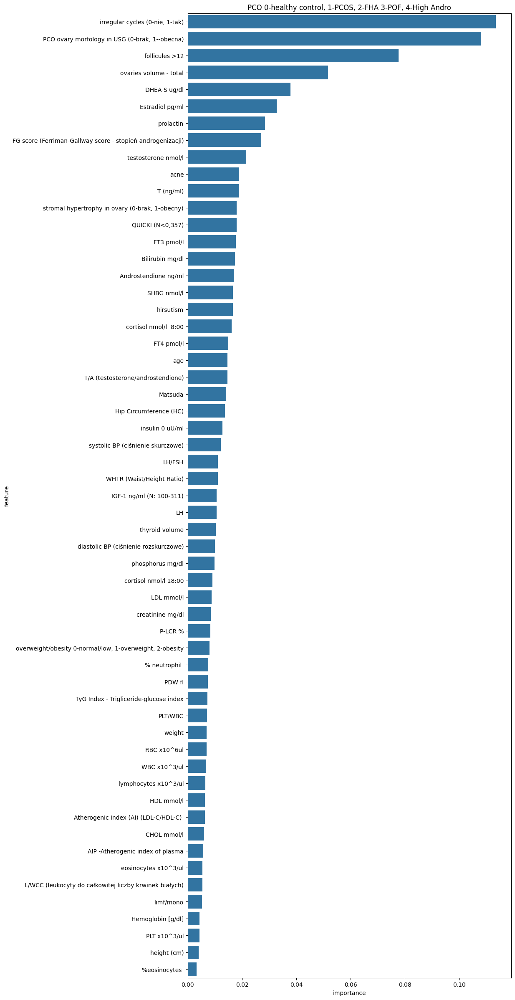

In [28]:
feature_subset = best_features_permutation

model_rf = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight=None, random_state=72)


feature_importnces_rf, pipeline_rf = validate_model_classification_smote(model_rf, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_rf)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


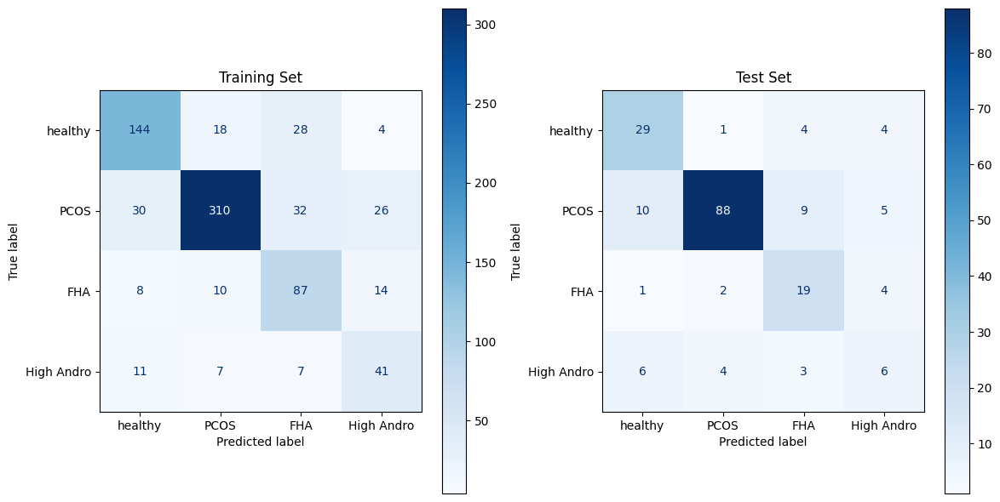

Training set
G-mean: 0.716
              precision    recall  f1-score   support

     healthy       0.75      0.74      0.74       194
        PCOS       0.90      0.78      0.83       398
         FHA       0.56      0.73      0.64       119
  High Andro       0.48      0.62      0.54        66

    accuracy                           0.75       777
   macro avg       0.67      0.72      0.69       777
weighted avg       0.77      0.75      0.76       777

G-mean: 0.61
Test set
              precision    recall  f1-score   support

     healthy       0.63      0.76      0.69        38
        PCOS       0.93      0.79      0.85       112
         FHA       0.54      0.73      0.62        26
  High Andro       0.32      0.32      0.32        19

    accuracy                           0.73       195
   macro avg       0.60      0.65      0.62       195
weighted avg       0.76      0.73      0.74       195



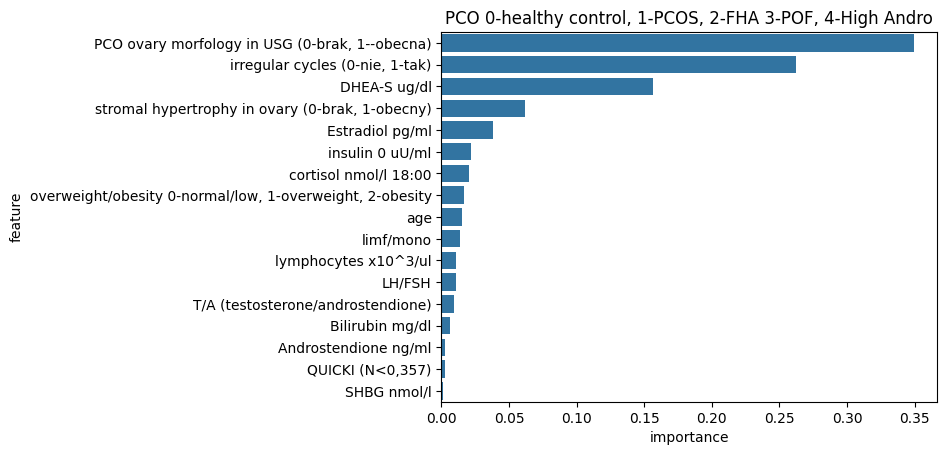

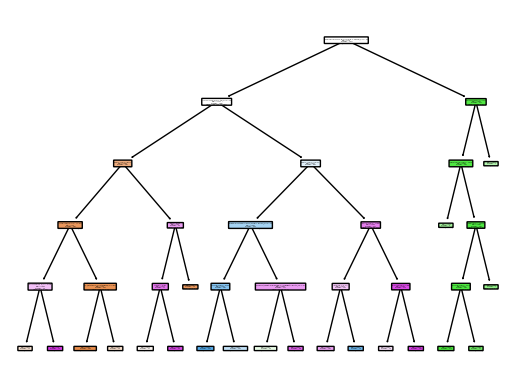

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


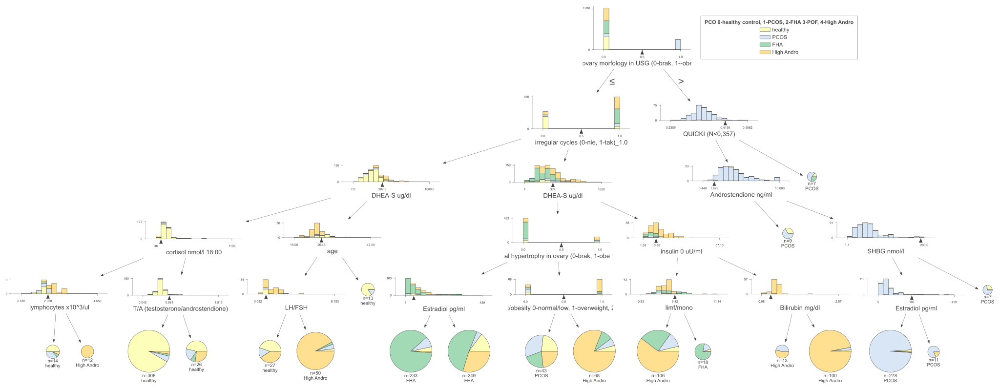

In [29]:
model_tree = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight=None)

feature_importnces_tree, pipeline_tree = validate_model_classification_smote(model_tree, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_tree)

plot_fancy_tree_smote(pipeline_tree, X_train, y_train, PCO, show_artificial_data=True, class_names=CLASS_NAMES)



c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


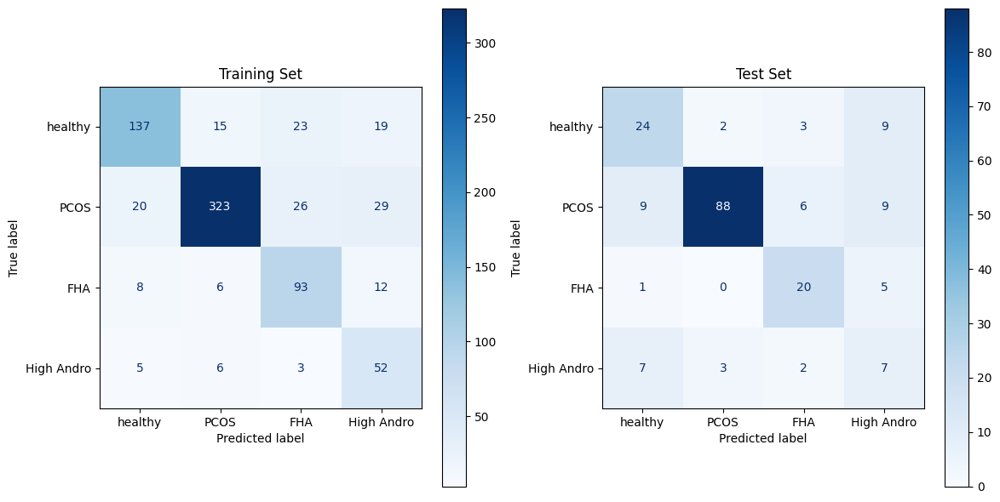

Training set
G-mean: 0.771
              precision    recall  f1-score   support

     healthy       0.81      0.71      0.75       194
        PCOS       0.92      0.81      0.86       398
         FHA       0.64      0.78      0.70       119
  High Andro       0.46      0.79      0.58        66

    accuracy                           0.78       777
   macro avg       0.71      0.77      0.73       777
weighted avg       0.81      0.78      0.79       777

G-mean: 0.612
Test set
              precision    recall  f1-score   support

     healthy       0.59      0.63      0.61        38
        PCOS       0.95      0.79      0.86       112
         FHA       0.65      0.77      0.70        26
  High Andro       0.23      0.37      0.29        19

    accuracy                           0.71       195
   macro avg       0.60      0.64      0.61       195
weighted avg       0.77      0.71      0.73       195



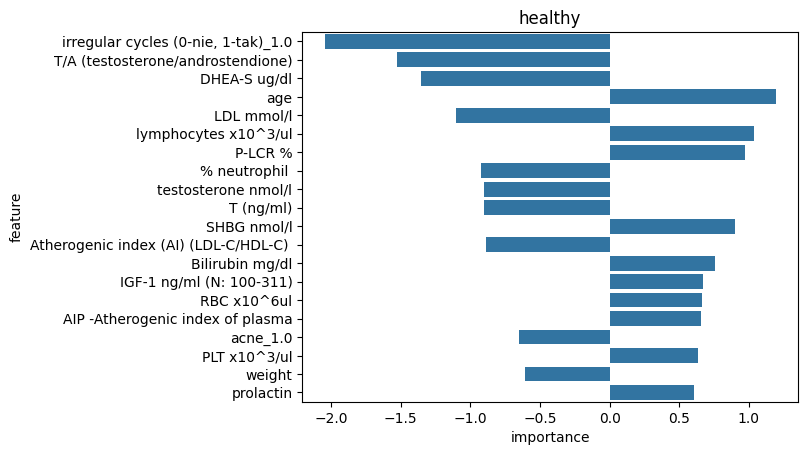

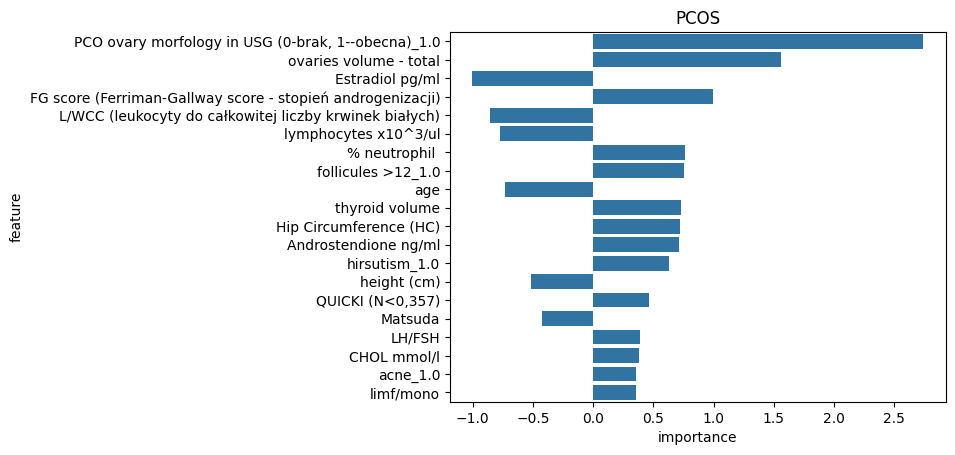

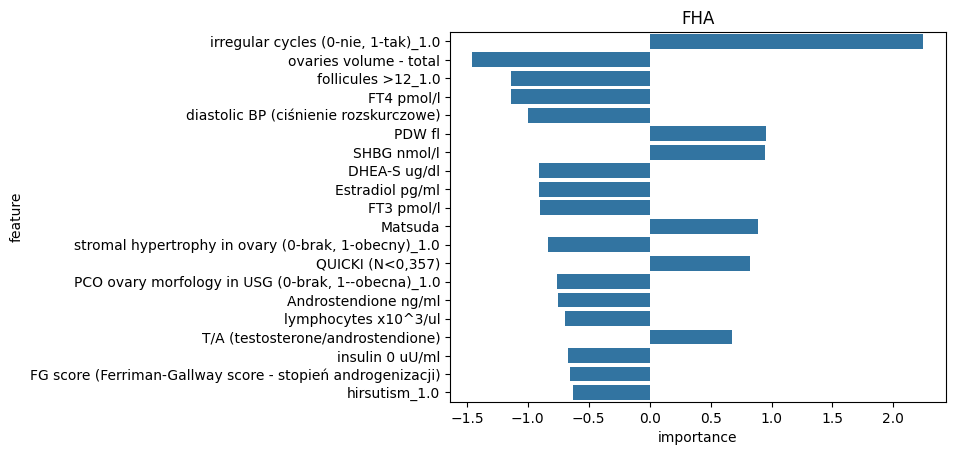

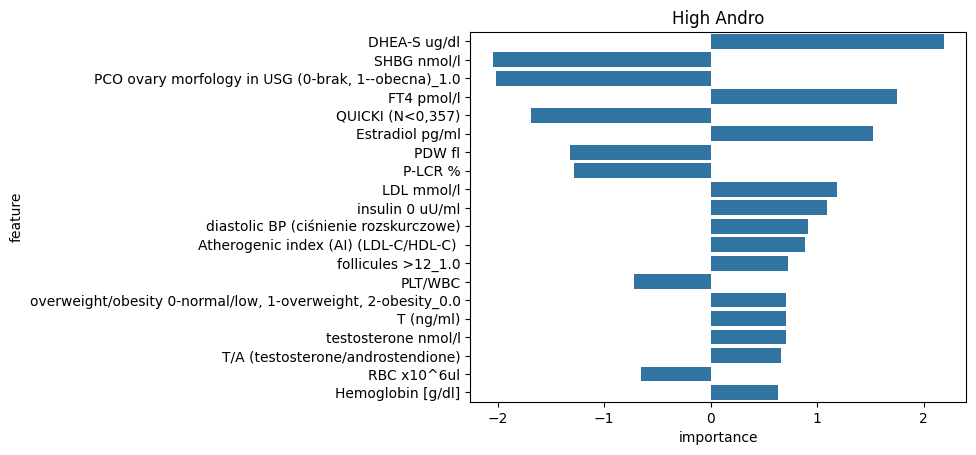

In [30]:

model_lr = LogisticRegression(C=0.5, multi_class='multinomial', max_iter=100000, n_jobs=-1)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_logistic_regressison)


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


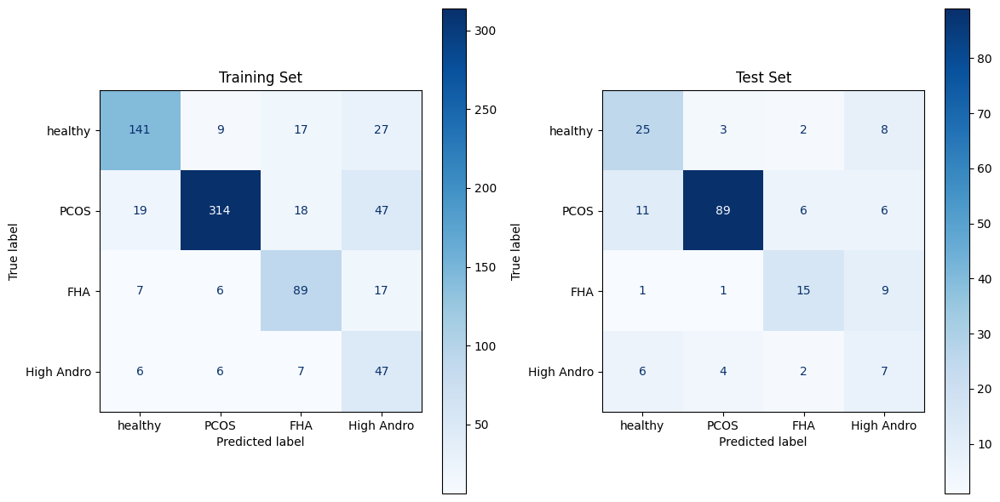

Training set
G-mean: 0.743
              precision    recall  f1-score   support

     healthy       0.82      0.73      0.77       194
        PCOS       0.94      0.79      0.86       398
         FHA       0.68      0.75      0.71       119
  High Andro       0.34      0.71      0.46        66

    accuracy                           0.76       777
   macro avg       0.69      0.74      0.70       777
weighted avg       0.82      0.76      0.78       777

G-mean: 0.577
Test set
              precision    recall  f1-score   support

     healthy       0.58      0.66      0.62        38
        PCOS       0.92      0.79      0.85       112
         FHA       0.60      0.58      0.59        26
  High Andro       0.23      0.37      0.29        19

    accuracy                           0.70       195
   macro avg       0.58      0.60      0.59       195
weighted avg       0.74      0.70      0.72       195



In [31]:

model_lr = KNeighborsClassifier(n_neighbors=5)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_knn)

### chi 2

In [41]:
len(selected_features_map['chi_2'])

21

In [32]:

sfs = SFS(
    estimator = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight=None), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring=gmean_scorer,
    cv=3,
    n_jobs=-1
)

sfs = sfs.fit(X_train[selected_features_map['chi_2']], y_train)

best_features_chi = sfs.get_feature_names_out()
len(best_features_chi), best_features_chi

(19,
 array(['PCO ovary morfology in USG (0-brak, 1--obecna)', 'follicules >12',
        'ovulation (0-brak, 1-obecna)',
        'stromal hypertrophy in ovary (0-brak, 1-obecny)', 'hirsutism',
        'hyperandrogenism', 'acne', 'irregular cycles (0-nie, 1-tak)',
        'WC>88', 'SHBG>110', 'elevated DHT', 'WHTR>0,5', 'HDL<50',
        'Hypertension', 'Volume of the  Left Ovary',
        'FTI (free testosterone index)',
        'FG score (Ferriman-Gallway score - stopień androgenizacji)',
        'Vole of the Right Ovary', 'SHBG nmol/l'], dtype=object))

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


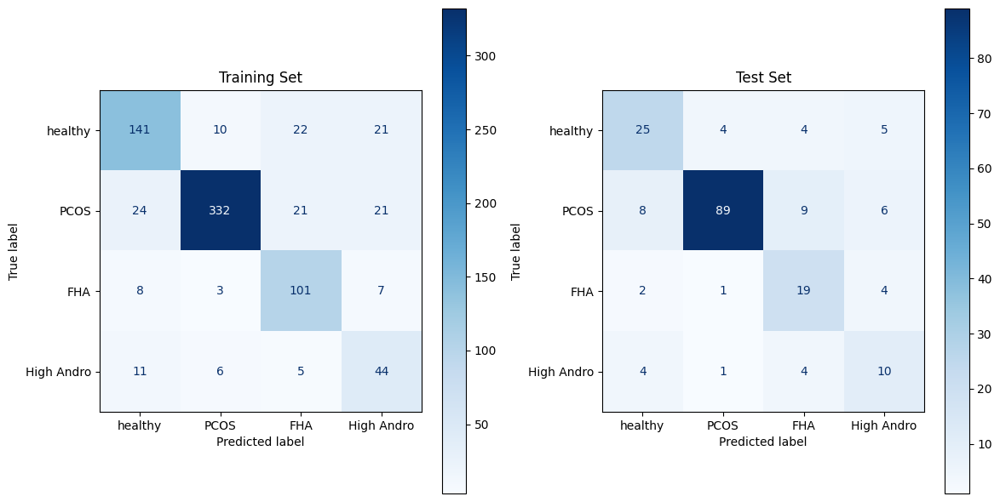

Training set
G-mean: 0.765
              precision    recall  f1-score   support

     healthy       0.77      0.73      0.75       194
        PCOS       0.95      0.83      0.89       398
         FHA       0.68      0.85      0.75       119
  High Andro       0.47      0.67      0.55        66

    accuracy                           0.80       777
   macro avg       0.72      0.77      0.73       777
weighted avg       0.82      0.80      0.80       777

G-mean: 0.67
Test set
              precision    recall  f1-score   support

     healthy       0.64      0.66      0.65        38
        PCOS       0.94      0.79      0.86       112
         FHA       0.53      0.73      0.61        26
  High Andro       0.40      0.53      0.45        19

    accuracy                           0.73       195
   macro avg       0.63      0.68      0.64       195
weighted avg       0.77      0.73      0.75       195



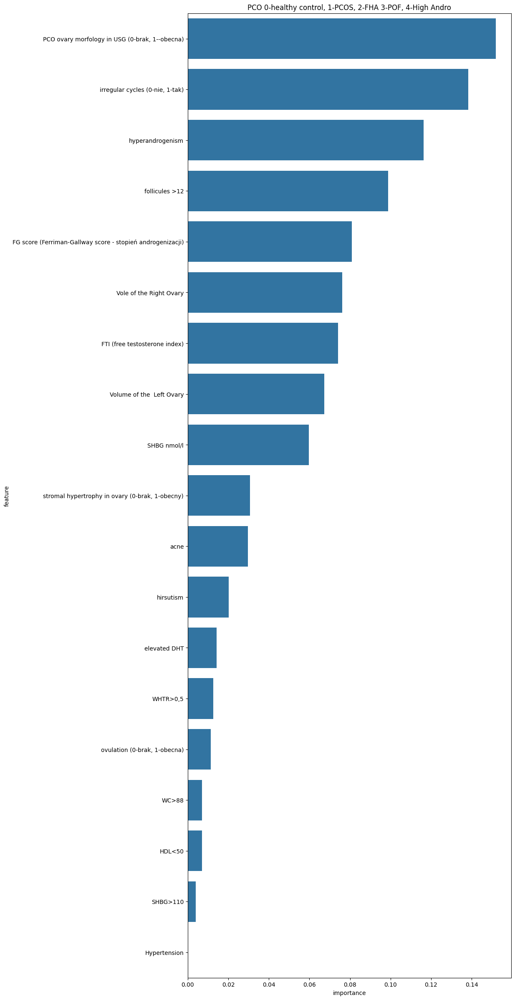

In [33]:
feature_subset = best_features_chi

model_rf = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=15, class_weight=None, random_state=72)


feature_importnces_rf, pipeline_rf = validate_model_classification_smote(model_rf, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_rf)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


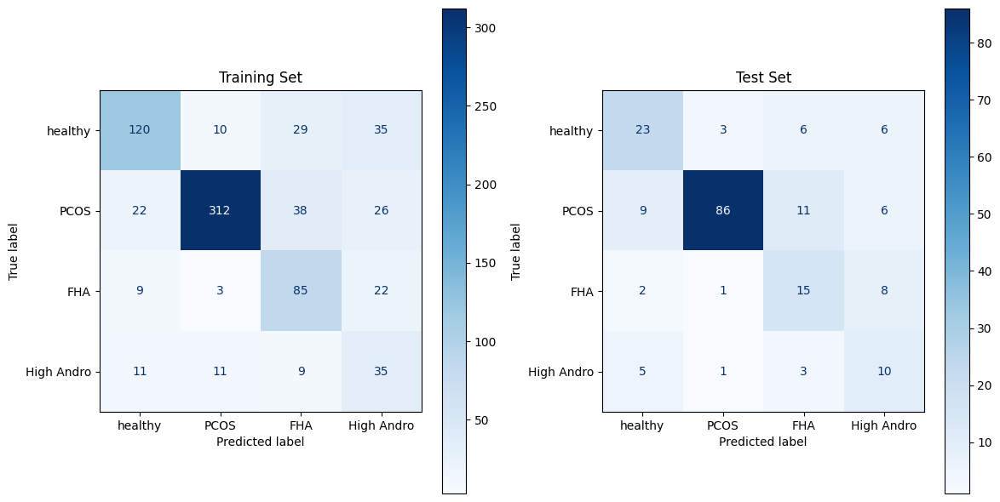

Training set
G-mean: 0.655
              precision    recall  f1-score   support

     healthy       0.74      0.62      0.67       194
        PCOS       0.93      0.78      0.85       398
         FHA       0.53      0.71      0.61       119
  High Andro       0.30      0.53      0.38        66

    accuracy                           0.71       777
   macro avg       0.62      0.66      0.63       777
weighted avg       0.77      0.71      0.73       777

G-mean: 0.613
Test set
              precision    recall  f1-score   support

     healthy       0.59      0.61      0.60        38
        PCOS       0.95      0.77      0.85       112
         FHA       0.43      0.58      0.49        26
  High Andro       0.33      0.53      0.41        19

    accuracy                           0.69       195
   macro avg       0.57      0.62      0.59       195
weighted avg       0.75      0.69      0.71       195



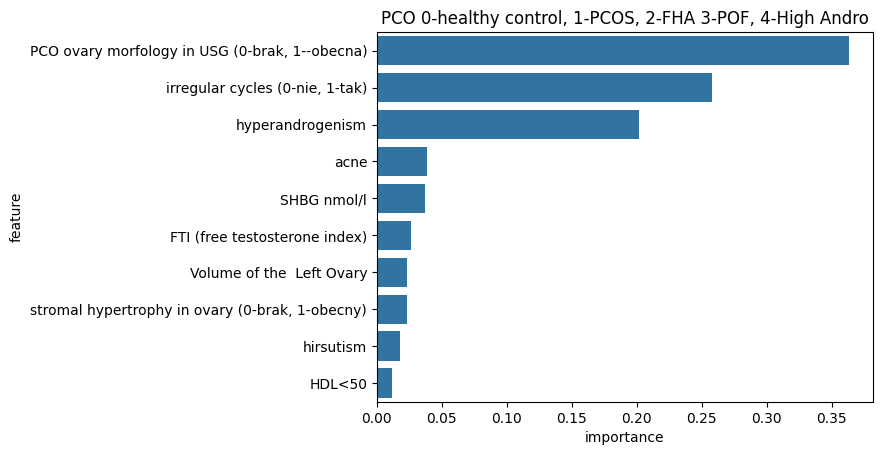

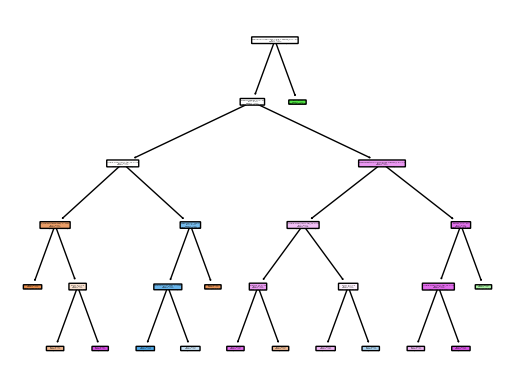

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


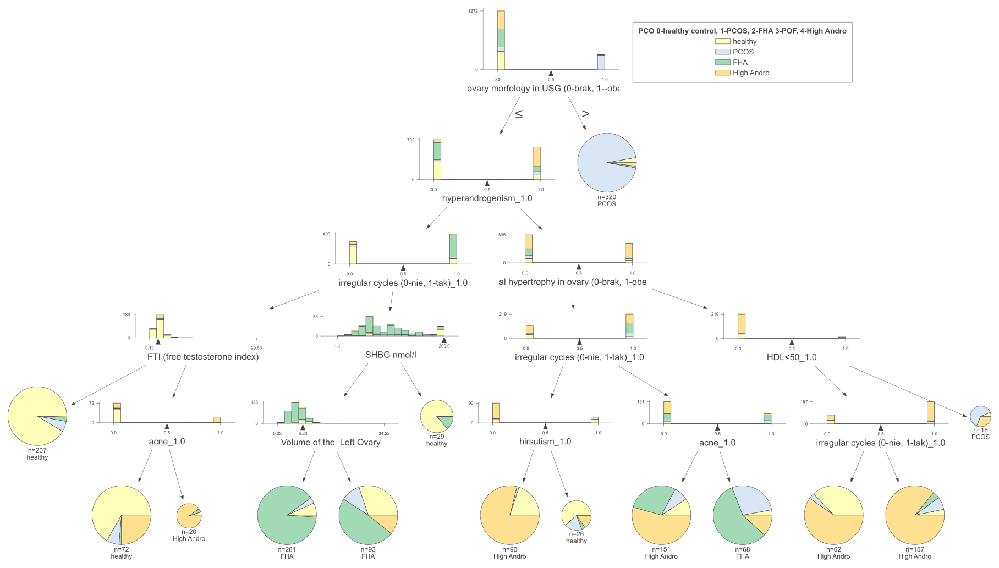

In [71]:
feature_subset = best_features_chi

model_tree = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight=None, ccp_alpha=0.003949836887359729)

feature_importnces_tree, pipeline_tree = validate_model_classification_smote(model_tree, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_tree_pipeline, categorical_imputer_pipeline, get_feature_importance_tree)

plot_fancy_tree_smote(pipeline_tree, X_train, y_train, PCO, show_artificial_data=True, class_names=CLASS_NAMES)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


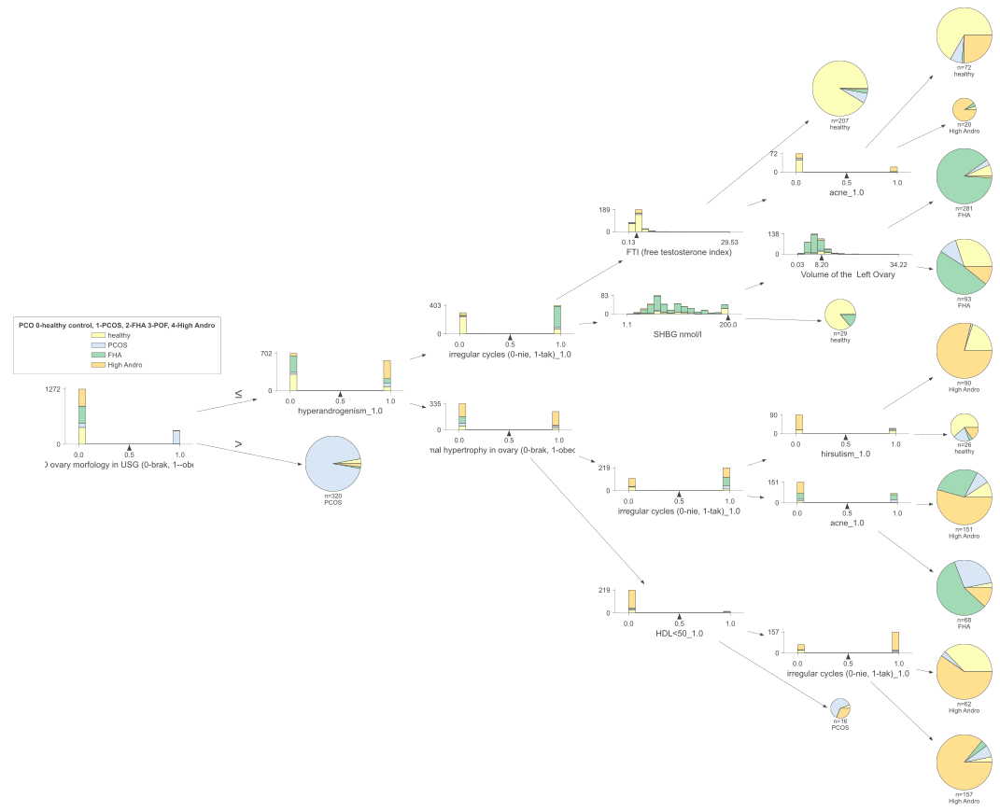

In [75]:
plot_fancy_tree_smote(pipeline_tree, X_train, y_train, PCO, show_artificial_data=True, class_names=CLASS_NAMES)

In [67]:
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold, cross_val_score
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

def prune_tree(tree_model, X_train, y_train):
    path = tree_model.cost_complexity_pruning_path(X_train, y_train)
    ccp_alphas = path.ccp_alphas[:-1]  # Exclude the maximum value to avoid an empty tree

    param_grid = {'ccp_alpha': ccp_alphas}
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
    grid_search = GridSearchCV(DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight=None, random_state=0), param_grid, cv=cv, scoring=make_scorer(geometric_mean_score))
    grid_search.fit(X_train, y_train)

    best_alpha = grid_search.best_params_['ccp_alpha']
    best_score = grid_search.best_score_
    print(f"Best ccp_alpha: {best_alpha} with CV g-mean: {best_score}")
    print(*zip(ccp_alphas, grid_search.cv_results_['mean_test_score']))

    # Train final model with best ccp_alpha
    final_clf = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight=None, random_state=0, ccp_alpha=best_alpha)
    final_clf.fit(X_train, y_train)

    # Plotting the results
    cv_results = grid_search.cv_results_
    mean_test_scores = cv_results['mean_test_score']
    
    fig, ax = plt.subplots()
    ax.set_xlabel("alpha")
    ax.set_ylabel("CV G-mean")
    ax.set_title("Cross-validated g-mean vs alpha")
    ax.plot(ccp_alphas, mean_test_scores, marker="o", drawstyle="steps-post")
    plt.show()

    return final_clf

Best ccp_alpha: 0.003949836887359729 with CV g-mean: 0.5885253133483449
(0.0, 0.5775835879597643) (0.00011705305822951647, 0.5775835879597643) (0.00017466446037874526, 0.5775835879597643) (0.00017664723547077595, 0.5775835879597643) (0.00029200869537003874, 0.5775835879597643) (0.00043408959071609965, 0.5775835879597643) (0.0013158416519761032, 0.5775835879597643) (0.0018913323261149336, 0.5775835879597643) (0.002952981213850781, 0.5782838103345581) (0.0030486309030195446, 0.5801720440801698) (0.003949836887359729, 0.5885253133483449) (0.0051857194714337515, 0.5303704782598092) (0.00540540540540542, 0.529963817280207) (0.0056333203952251415, 0.49639732518568075) (0.005669103460175698, 0.49639732518568075) (0.007210110007767778, 0.4534046148809328) (0.008486946892743999, 0.4742555993867337) (0.009191243462343235, 0.4759953330300721) (0.01996075428210925, 0.5281928847626796) (0.03342316829573201, 0.289133484220604) (0.06325909190820306, 0.0)


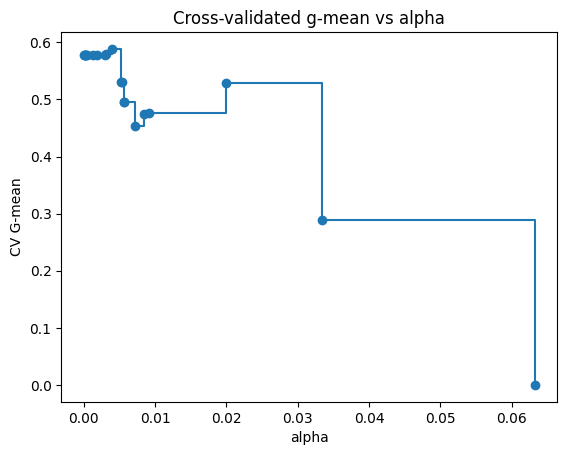

Test set G-mean with best ccp_alpha: 0.6334804012172642


In [68]:
# model_tree = DecisionTreeClassifier(criterion='gini', max_depth=5, min_samples_leaf=7, min_samples_split=15, class_weight=None)

final_model = prune_tree(model_tree, X_train[feature_subset], y_train)

test_g_mean = geometric_mean_score(y_test, final_model.predict(X_test[feature_subset])) 
print(f"Test set G-mean with best ccp_alpha: {test_g_mean}")

In [74]:


def plot_fancy_tree_smote(pipeline, X_train, y_train, target_name, show_artificial_data=False, class_names=None, is_classification=True):
    preprocessing_pipeline = ImblearnPipeline(steps=pipeline.steps[:-1])

    if show_artificial_data:
        smote_pipeline = ImblearnPipeline(steps=pipeline.steps[:-2])
        _, y_transformed = smote_pipeline.fit_resample(X_train, y_train)
        X_transformed = preprocessing_pipeline.fit_transform(X_train, y_train)
    else:
        new_pipeline = Pipeline(steps=[pipeline.steps[0], pipeline.steps[2]])
        X_transformed = new_pipeline.fit_transform(X_train, y_train)
        y_transformed = y_train
    
    column_names = preprocessing_pipeline.get_feature_names_out()

    if is_classification:
        viz_model = dtreeviz.model(pipeline['model'],
                            X_train=X_transformed,
                            y_train=y_transformed.astype(int),
                            feature_names=column_names,
                            target_name=target_name,
                            class_names=class_names,
                            )
    else:
        viz_model = dtreeviz.model(pipeline['model'],
                    X_train=X_transformed,
                    y_train=y_train,
                    feature_names=column_names,
                    target_name=target_name,
                    )

    #  if I wanted to save the tree
    # v = viz_model.view(scale=1.8)
    # v.show()
    # v.save("charts/trees/pco_multiclass_decision_tree.svg")  

    return viz_model.view(scale=1, ticks_fontsize=10, orientation='LR')

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


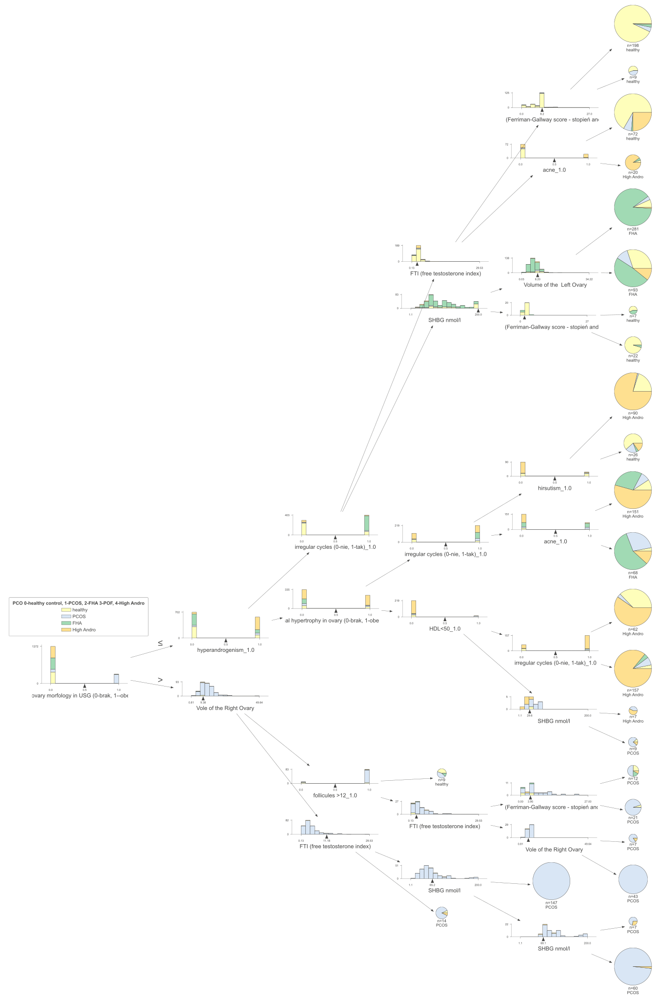

In [53]:
plot_fancy_tree_smote(pipeline_tree, X_train, y_train, PCO, show_artificial_data=True, class_names=CLASS_NAMES)


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


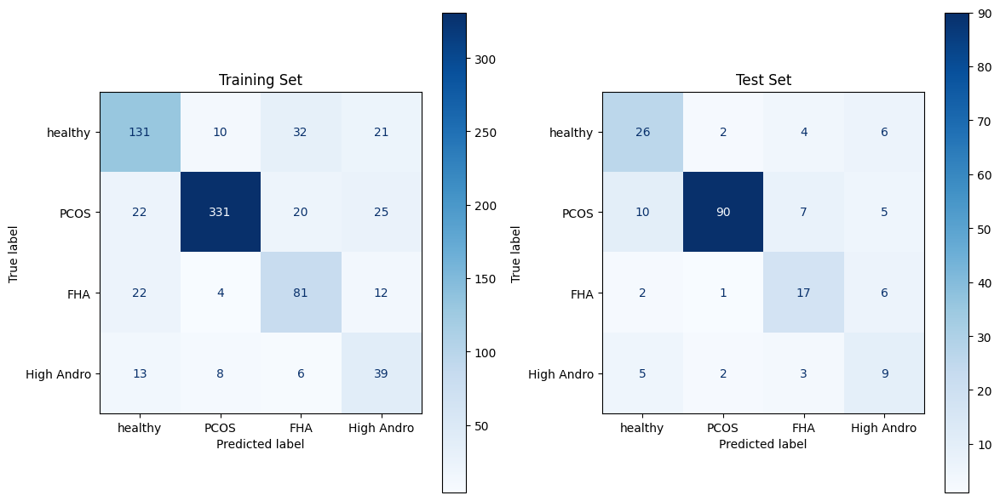

Training set
G-mean: 0.689
              precision    recall  f1-score   support

     healthy       0.70      0.68      0.69       194
        PCOS       0.94      0.83      0.88       398
         FHA       0.58      0.68      0.63       119
  High Andro       0.40      0.59      0.48        66

    accuracy                           0.75       777
   macro avg       0.65      0.69      0.67       777
weighted avg       0.78      0.75      0.76       777

G-mean: 0.642
Test set
              precision    recall  f1-score   support

     healthy       0.60      0.68      0.64        38
        PCOS       0.95      0.80      0.87       112
         FHA       0.55      0.65      0.60        26
  High Andro       0.35      0.47      0.40        19

    accuracy                           0.73       195
   macro avg       0.61      0.65      0.63       195
weighted avg       0.77      0.73      0.74       195



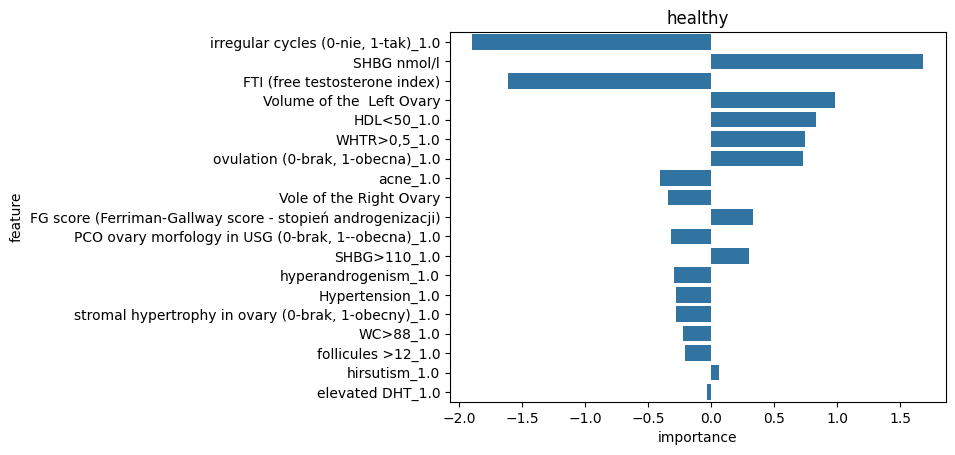

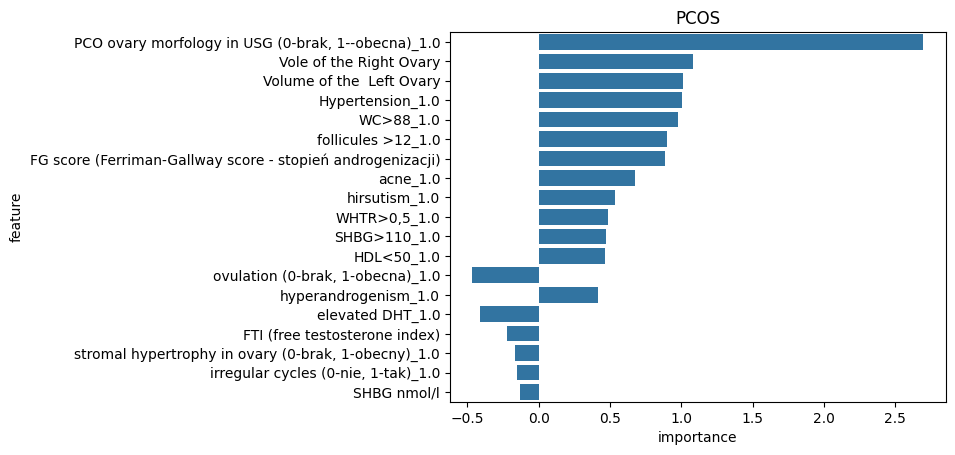

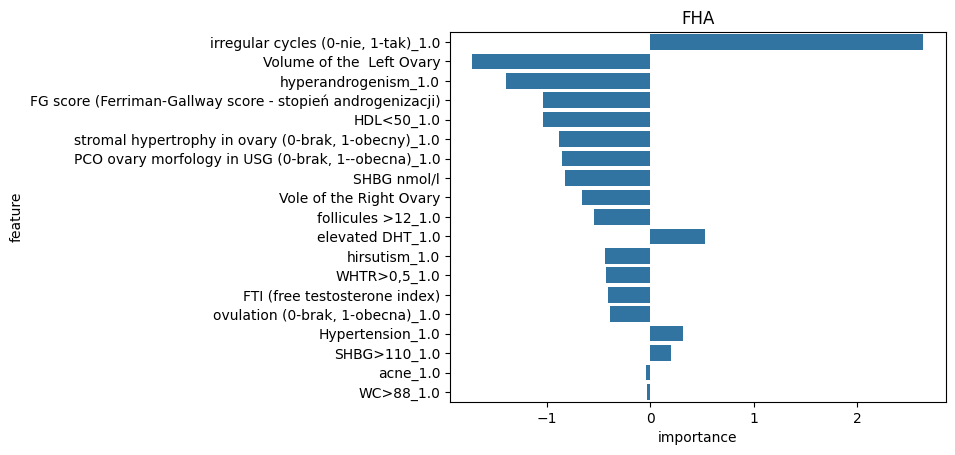

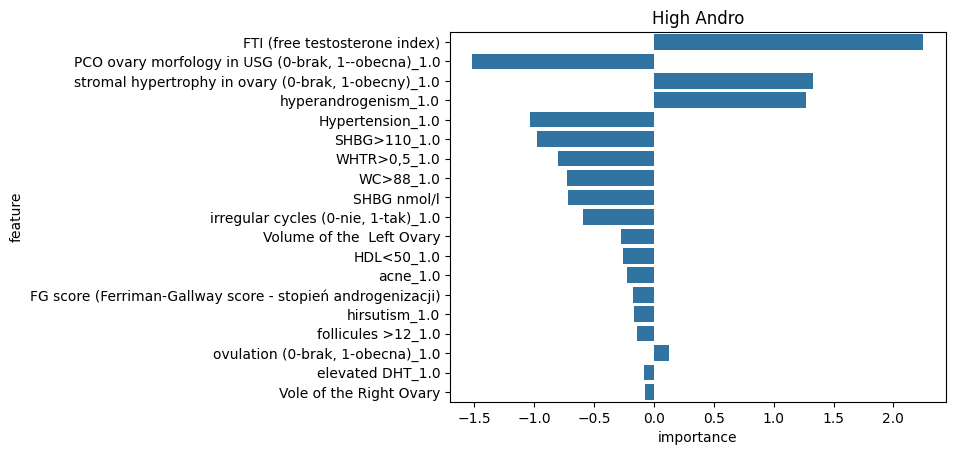

In [35]:

model_lr = LogisticRegression(C=0.5, multi_class='multinomial', max_iter=100000, n_jobs=-1)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_logistic_regressison)


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


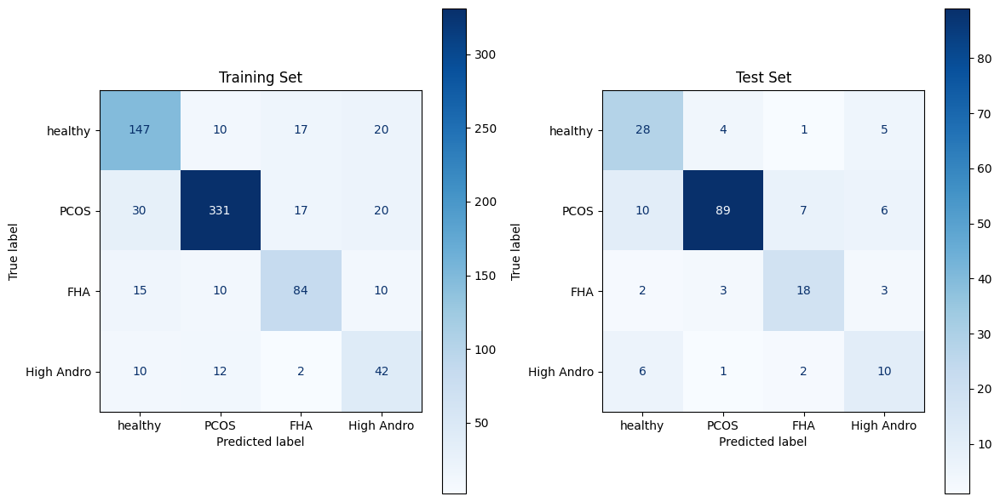

Training set
G-mean: 0.729
              precision    recall  f1-score   support

     healthy       0.73      0.76      0.74       194
        PCOS       0.91      0.83      0.87       398
         FHA       0.70      0.71      0.70       119
  High Andro       0.46      0.64      0.53        66

    accuracy                           0.78       777
   macro avg       0.70      0.73      0.71       777
weighted avg       0.79      0.78      0.78       777

G-mean: 0.68
Test set
              precision    recall  f1-score   support

     healthy       0.61      0.74      0.67        38
        PCOS       0.92      0.79      0.85       112
         FHA       0.64      0.69      0.67        26
  High Andro       0.42      0.53      0.47        19

    accuracy                           0.74       195
   macro avg       0.65      0.69      0.66       195
weighted avg       0.77      0.74      0.75       195



In [36]:

model_lr = KNeighborsClassifier(n_neighbors=5)

feature_importnces_lr, pipeline_tlr = validate_model_classification_smote(model_lr, PCO, CLASS_NAMES, X_train[feature_subset], y_train, X_test[feature_subset], y_test, continuous_imputer_pipeline, categorical_imputer_pipeline, get_feature_importance_knn)